**Adv. AI Project**

In [ ]:
!pip install squidpy scanpy matplotlib seaborn igraph leidenalg numpy SpaGCN tangram-sc tensorflow scikit-learn

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.8/87.8 kB 4.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of dask-expr to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of distributed to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.3/161.3 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 34.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 75.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 70.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 86.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.5/144.5 kB 10.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
!pip install scanpy squidpy networkx

  Using cached squidpy-1.6.5-py3-none-any.whl.metadata (9.0 kB)
  Using cached dask_image-2024.5.3-py3-none-any.whl.metadata (2.8 kB)
  Using cached dask-2024.11.2-py3-none-any.whl.metadata (3.7 kB)
  Using cached docrep-0.3.2.tar.gz (33 kB)
  Preparing metadata (setup.py) ... done
  Using cached matplotlib_scalebar-0.9.0-py3-none-any.whl.metadata (18 kB)
  Using cached omnipath-1.0.9-py3-none-any.whl.metadata (7.0 kB)
  Using cached spatialdata-0.3.0-py3-none-any.whl.metadata (9.8 kB)
  Using cached validators-0.34.0-py3-none-any.whl.metadata (3.8 kB)
  Using cached zarr-2.18.7-py3-none-any.whl.metadata (5.8 kB)
  Using cached pims-0.7.tar.gz (87 kB)
  Preparing metadata (setup.py) ... done
  Using cached multiscale_spatial_image-2.0.2-py3-none-any.whl.metadata (25 kB)
  Using cached ome_zarr-0.10.3-py3-none-any.whl.metadata (3.1 kB)
  Using cached spatial_image-1.2.1-py3-none-any.whl.metadata (7.0 kB)
  Using cached xarray_schema-0.0.3-py3-none-any.whl.metadata (4.3 kB)
  Using cache

In [ ]:
# Import libraries
import scanpy as sc
import squidpy as sq
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import networkx as nx

/usr/lib/python3.11/importlib/__init__.py:126: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  return _bootstrap._gcd_import(name[level:], package, level)
/usr/local/lib/python3.11/dist-packages/cudf/utils/_ptxcompiler.py:64: UserWarning: Error getting driver and runtime versions:

stdout:



stderr:

Traceback (most recent call last):
  File "<string>", line 4, in <module>
  File "/usr/local/lib/python3.11/dist-packages/numba_cuda/numba/cuda/cudadrv/driver.py", line 314, in __getattr__
    raise CudaSupportError("Error at driver init: \n%s:" %
numba.cuda.cudadrv.error.CudaSupportError: Error at driver init: 

CUDA driver library cannot be found.
If you are sure that a CUDA driver is installed,
try setting environment variable NUMBA_CUDA_DRIVER
with the file path of the CUDA d

In [ ]:
# Load the mouse brain dataset from Squidpy
adata = sq.datasets.visium_fluo_adata()

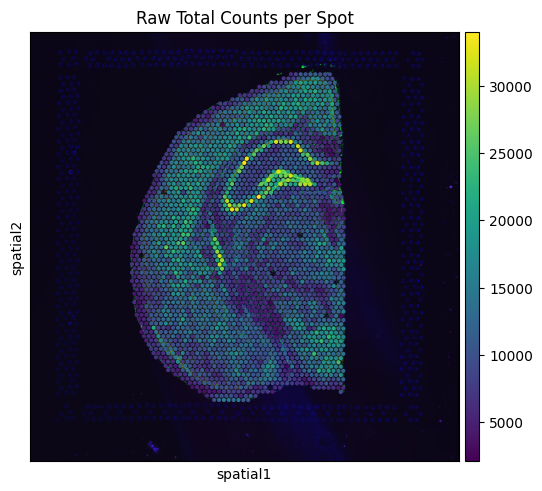

In [ ]:
# Visualize unnormalized total RNA counts per spot
sq.pl.spatial_scatter(
   adata,
   color="total_counts",
   img=True,
   title="Raw Total Counts per Spot",
   size=1.3,
   cmap="viridis"
)


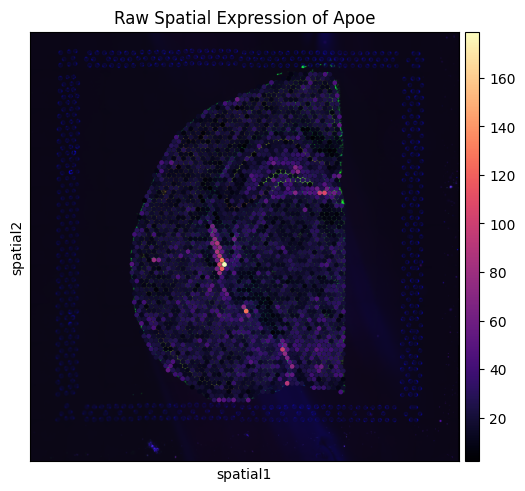

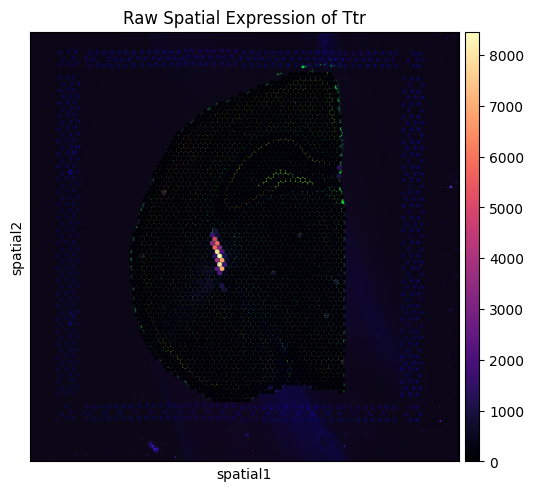

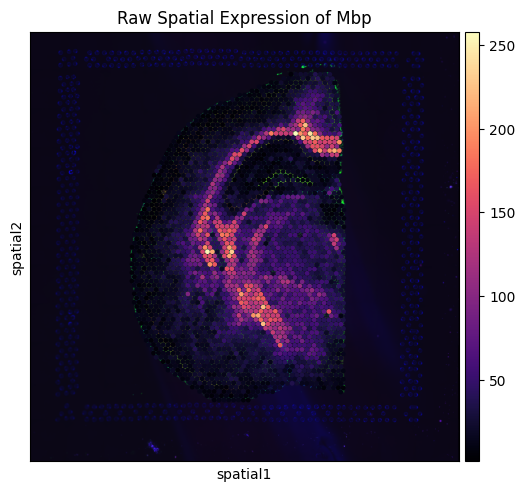

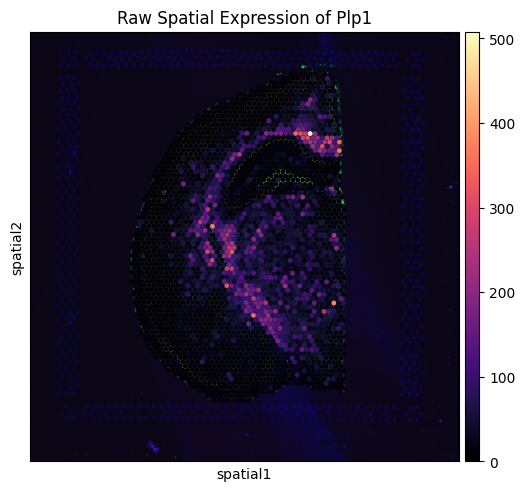

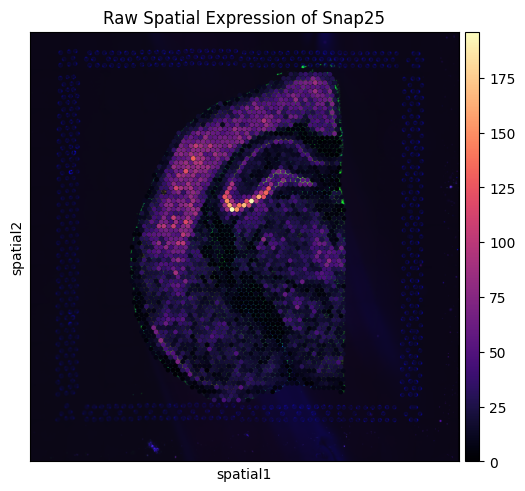

In [ ]:
import squidpy as sq
import scanpy as sc
import matplotlib.pyplot as plt

# Genes to explore spatially
genes_of_interest = ["Apoe", "Ttr", "Mbp", "Plp1", "Snap25"]

# raw expression of each gene over the tissue layout
for gene in genes_of_interest:
    if gene in adata.var_names:
        sq.pl.spatial_scatter(
            adata,
            color=gene,
            img=True,
            cmap="magma",
            size=1.5,
            title=f"Raw Spatial Expression of {gene}"
        )
    else:
        print(f"{gene} not found in dataset.")


In [ ]:
sc.pp.filter_genes(adata, min_cells=3)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.umap(adata)
sc.tl.leiden(adata, resolution=0.5)

<ipython-input-8-26697fa0e141>:8: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.5)


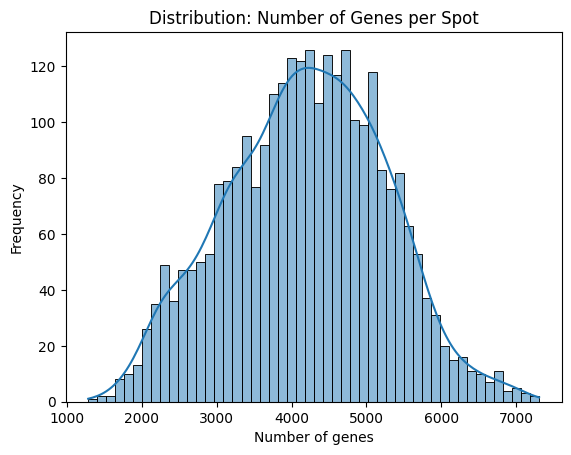

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt


sns.histplot(adata.obs["n_genes_by_counts"], bins=50, kde=True)
plt.title("Distribution: Number of Genes per Spot")
plt.xlabel("Number of genes")
plt.ylabel("Frequency")
plt.show()

  0%|          | 0.00/242M [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


Top genes in PC1 (neuronal/glial): ['Cldn11', 'Mobp', 'Mal', 'Tspan2', 'Trf', 'Ermn', 'Plp1', 'Plekhb1', 'Bcas1', 'Mog']
Top genes in PC2 (cortical gradient): ['Prkcd', 'Slc17a6', 'Tcf7l2', 'Ddn', 'Rora', 'Pdp1', 'Plcb4', 'Nrgn', 'Adarb1', 'Rims3']
Top genes in PC3 (oligodendrocyte marker): ['Nnat', 'Hap1', 'Pmch', 'Rasgrp1', 'Zcchc12', 'Resp18', 'Slc24a2', 'Ahi1', 'Cck', 'Hcrt']


<ipython-input-10-ae283e61f572>:36: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


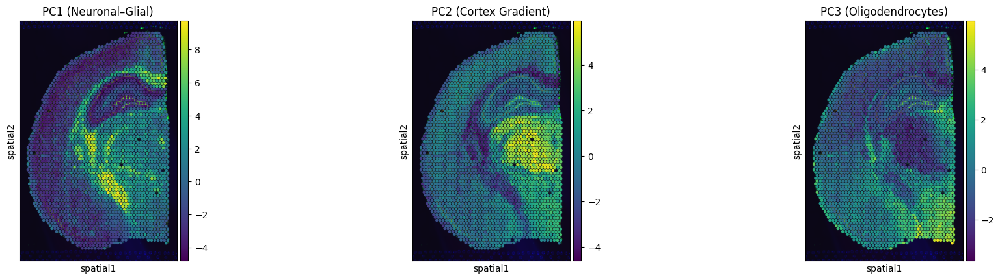

In [ ]:
import squidpy as sq
import scanpy as sc
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Load the dataset
adata = sq.datasets.visium_fluo_adata()
adata.var_names_make_unique()

# Preprocessing
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=2000)
adata = adata[:, adata.var.highly_variable]
sc.pp.pca(adata, n_comps=30)

# Extract top genes
pc_loadings = pd.DataFrame(adata.varm["PCs"], index=adata.var_names)
top_pc1 = pc_loadings[0].abs().sort_values(ascending=False).head(10)
top_pc2 = pc_loadings[1].abs().sort_values(ascending=False).head(10)
top_pc3 = pc_loadings[2].abs().sort_values(ascending=False).head(10)

print("Top genes in PC1 (neuronal/glial):", top_pc1.index.tolist())
print("Top genes in PC2 (cortical gradient):", top_pc2.index.tolist())
print("Top genes in PC3 (oligodendrocyte marker):", top_pc3.index.tolist())

# Add PC1–PC3 scores to adata.obs
for i in range(3):
    adata.obs[f'PC{i+1}'] = adata.obsm['X_pca'][:, i]

# Spatial plots of PC scores
sc.pl.spatial(
    adata,
    color=["PC1", "PC2", "PC3"],
    cmap="viridis",
    size=1.4,
    title=["PC1 (Neuronal–Glial)", "PC2 (Cortex Gradient)", "PC3 (Oligodendrocytes)"]
)

In [ ]:
import numpy as np


# Use preprocessed expression matrix (adata.X)
X_proc = adata.X


# Sum expression for each gene across all spots
gene_sums_proc = (
   X_proc.sum(axis=0).A1 if hasattr(X_proc, "A1") else np.asarray(X_proc.sum(axis=0)).flatten()
)


# Get indices of top genes
top_idx_proc = np.argsort(gene_sums_proc)[::-1][:10]


# Use var_names from preprocessed data
top_gene_names_proc = adata.var_names[top_idx_proc]


# Display the top genes
print("Top 10 expressed genes (after preprocessing):")
for i, gene in enumerate(top_gene_names_proc):
   print(f"{i+1}. {gene}")

Top 10 expressed genes (after preprocessing):
1. mt-Co1
2. mt-Co3
3. Gm42418
4. mt-Atp6
5. mt-Co2
6. mt-Cytb
7. mt-Nd4
8. mt-Nd2
9. mt-Nd1
10. Fth1


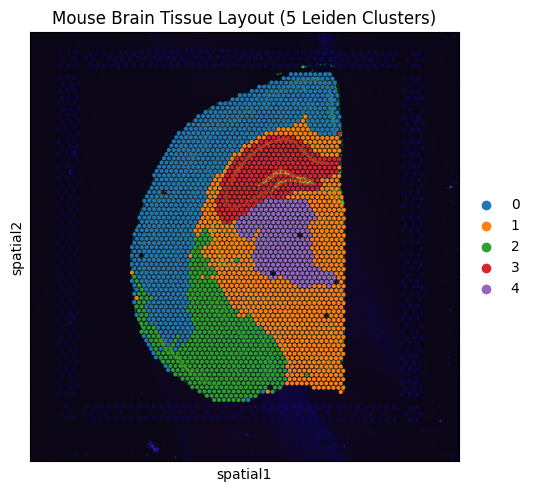

In [ ]:
import scanpy as sc
import squidpy as sq

# Load spatial transcriptomics data
adata = sq.datasets.visium_fluo_adata()

# Preprocessing
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# Run Leiden clustering with 5 clusters
sc.pp.neighbors(adata)
sc.tl.leiden(adata, resolution=0.12, key_added="leiden")
adata.uns.pop('leiden_colors', None)

# Plot clustering
sq.pl.spatial_scatter(adata, color='leiden', title="Mouse Brain Tissue Layout (5 Leiden Clusters)", size=1.3)


/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


Showing astrocytes markers: ['Aqp4', 'Gfap']


<ipython-input-18-762c434f059e>:63: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=genes, size=1.3, title=f"{cell_type.title()} Markers")


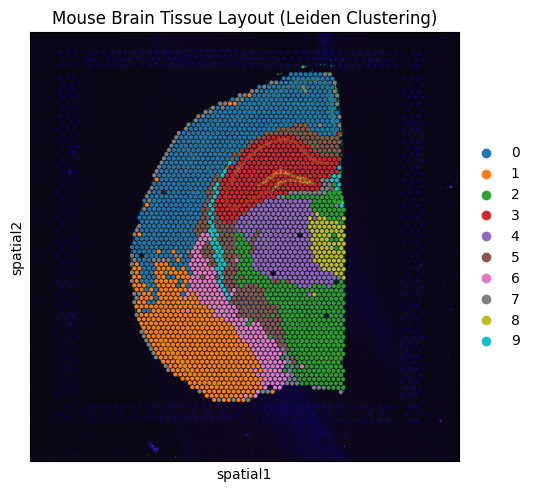

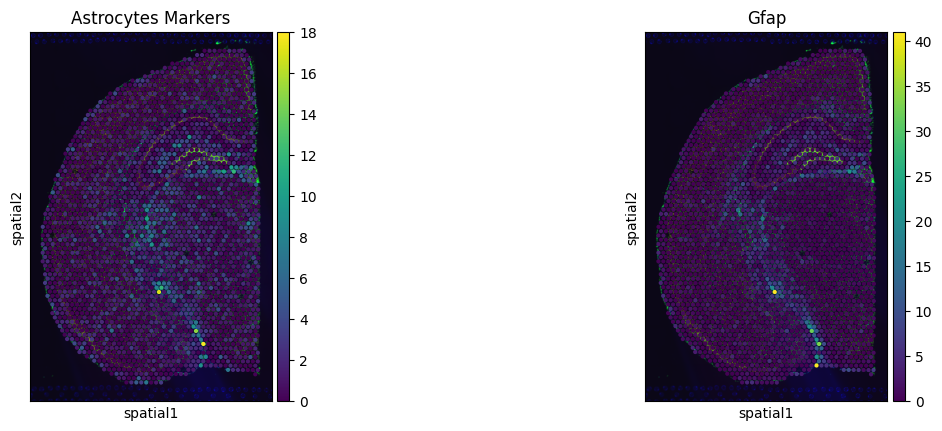

Showing oligodendrocytes markers: ['Mbp', 'Plp1']


<ipython-input-18-762c434f059e>:63: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=genes, size=1.3, title=f"{cell_type.title()} Markers")


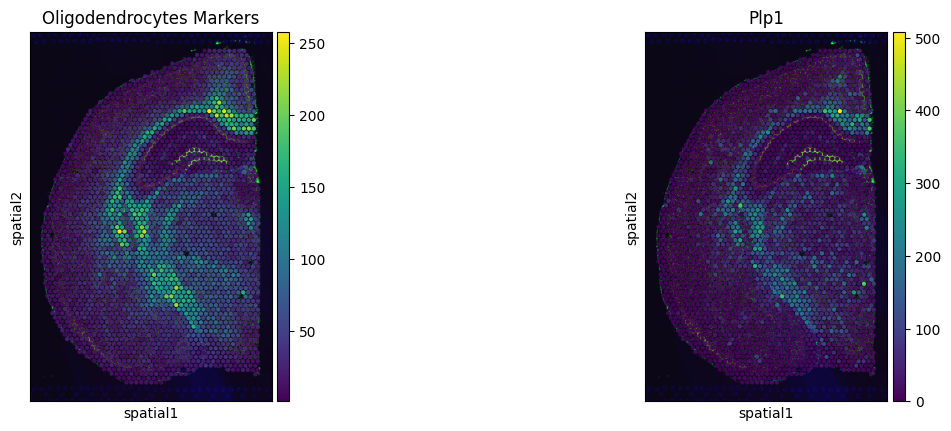

Showing microglia markers: ['C1qa', 'Cx3cr1']


<ipython-input-18-762c434f059e>:63: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=genes, size=1.3, title=f"{cell_type.title()} Markers")


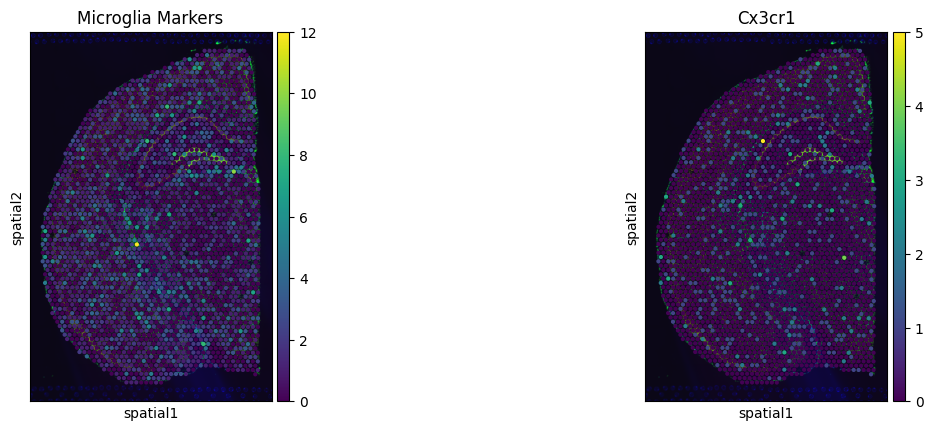

Showing endothelial markers: ['Pecam1']


<ipython-input-18-762c434f059e>:63: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=genes, size=1.3, title=f"{cell_type.title()} Markers")


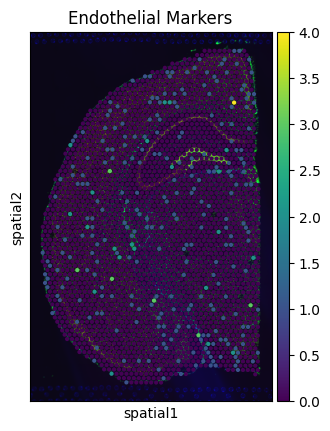

<ipython-input-18-762c434f059e>:69: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_expr = adata[:, genes].to_df().groupby(adata.obs["leiden"]).mean().mean(axis=1)
<ipython-input-18-762c434f059e>:69: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_expr = adata[:, genes].to_df().groupby(adata.obs["leiden"]).mean().mean(axis=1)
<ipython-input-18-762c434f059e>:69: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  avg_expr =

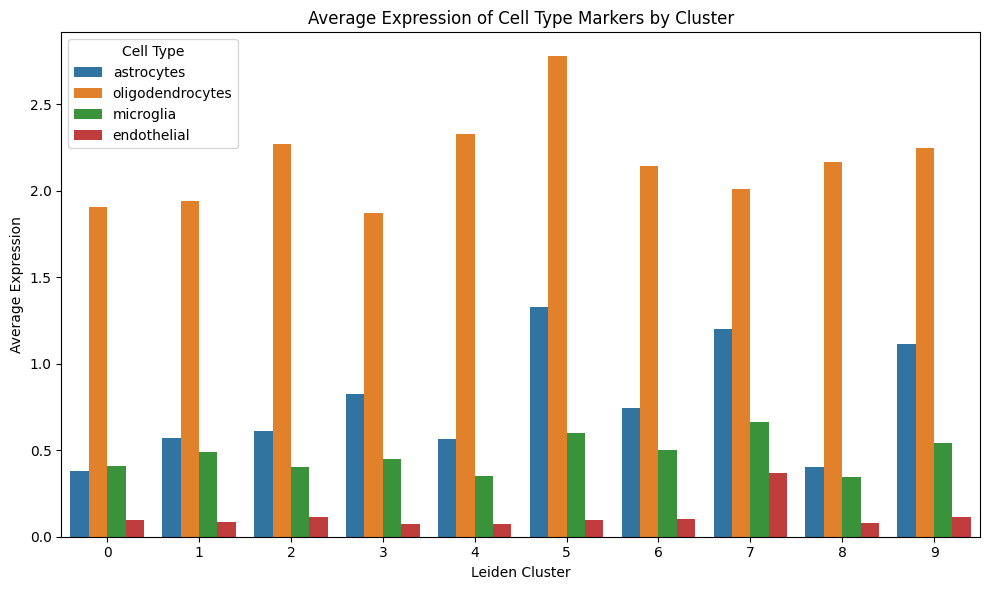

In [ ]:
import squidpy as sq
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


adata = sq.datasets.visium_fluo_adata()


sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# Identify highly variable genes
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)
adata = adata[:, adata.var.highly_variable]

# PCA and neighborhood graph
sc.pp.pca(adata)
sc.pp.neighbors(adata)

# Leiden Clustering

sc.tl.leiden(adata, resolution=0.5, key_added="leiden")

adata.uns.pop("leiden_colors", None)


# Spatial Visualization of Clusters

sq.pl.spatial_scatter(
    adata, color="leiden",
    title="Mouse Brain Tissue Layout (Leiden Clustering)",
    size=1.3
)


#Associate Clusters with Cell Types using Marker Genes

# Define marker genes for brain cell types
marker_genes = {
    "astrocytes": ["Aqp4", "Gfap"],
    "neurons": ["Snap25", "Rbfox3"],
    "oligodendrocytes": ["Mbp", "Plp1"],
    "microglia": ["C1qa", "Cx3cr1"],
    "endothelial": ["Cdh5", "Pecam1"]
}

# Check which marker genes are in the dataset
present_markers = {ct: [g for g in genes if g in adata.var_names] for ct, genes in marker_genes.items()}

# Plot spatial expression for each cell type
for cell_type, genes in present_markers.items():
    if genes:
        print(f"Showing {cell_type} markers: {genes}")
        sc.pl.spatial(adata, color=genes, size=1.3, title=f"{cell_type.title()} Markers")

# Plot average expression per cluster for each cell type
cluster_expression = []
for cell_type, genes in present_markers.items():
    if genes:
        avg_expr = adata[:, genes].to_df().groupby(adata.obs["leiden"]).mean().mean(axis=1)
        cluster_expression.append(pd.DataFrame({
            "cluster": avg_expr.index,
            "avg_expr": avg_expr.values,
            "cell_type": cell_type
        }))

df_clusters = pd.concat(cluster_expression)
plt.figure(figsize=(10, 6))
sns.barplot(data=df_clusters, x="cluster", y="avg_expr", hue="cell_type")
plt.title("Average Expression of Cell Type Markers by Cluster")
plt.ylabel("Average Expression")
plt.xlabel("Leiden Cluster")
plt.legend(title="Cell Type")
plt.tight_layout()
plt.show()


In [ ]:
simport tangram as tg
import scanpy as sc
import squidpy as sq

# Spatial dataset
adata_spatial = sq.datasets.visium_fluo_adata()
print(adata_spatial.uns["spatial"].keys())



dict_keys(['V1_Adult_Mouse_Brain_Coronal_Section_2'])


INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
INFO:matplotlib.category:Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


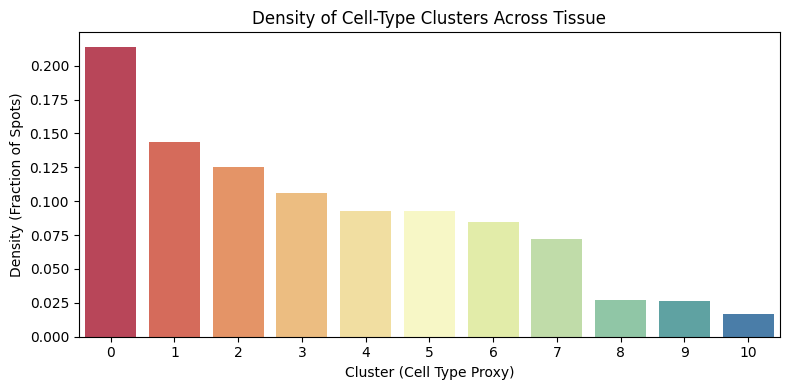

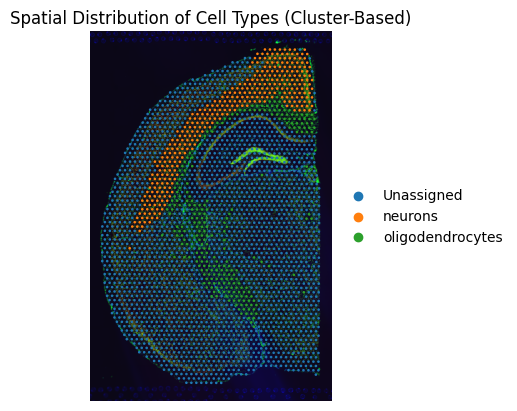

In [ ]:
# Precompute neighbors and run Leiden clustering
sc.pp.neighbors(adata)
sc.tl.leiden(adata, resolution=0.3, key_added="leiden_lowres")
# Count how many cells in each cluster
cluster_counts = adata.obs["leiden_lowres"].value_counts().sort_index()
cluster_density = cluster_counts / len(adata)

# Plot
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 4))
sns.barplot(x=cluster_density.index, y=cluster_density.values, palette="Spectral")
plt.xlabel("Cluster (Cell Type Proxy)")
plt.ylabel("Density (Fraction of Spots)")
plt.title("Density of Cell-Type Clusters Across Tissue")
plt.tight_layout()
plt.show()

# Define canonical marker genes for known brain cell types
cell_types = {
    "astrocytes": ["Gfap", "Aqp4"],
    "neurons": ["Snap25", "Syt1"],
    "oligodendrocytes": ["Mbp", "Plp1"],
    "microglia": ["C1qa", "Trem2"],
    "endothelial": ["Cdh5", "Pecam1"]
}

# Run DE test to identify markers per cluster
sc.tl.rank_genes_groups(adata, groupby="leiden_lowres", method="t-test", n_genes=20)

# Match top markers to known cell types
cluster_labels = []
for cluster in adata.obs["leiden_lowres"].cat.categories:
    top_genes = adata.uns["rank_genes_groups"]["names"][cluster][:10]
    top_genes = [g.lower() for g in top_genes]

    assigned = "Unassigned"
    for cell_type, markers in cell_types.items():
        if any(marker.lower() in top_genes for marker in markers):
            assigned = cell_type
            break
    cluster_labels.append((cluster, assigned))

# Convert to dictionary
cluster_label_dict = {k: v for k, v in cluster_labels}

# Add to adata.obs
adata.obs["cell_type_label"] = adata.obs["leiden_lowres"].map(cluster_label_dict)

sc.pl.spatial(
    adata,
    color="cell_type_label",
    title="Spatial Distribution of Cell Types (Cluster-Based)",
    size=1.8,
    legend_loc='right margin',
    frameon=False,
    legend_fontsize=10,
    ncols=1,
    spot_size=80
)


In [ ]:
import squidpy as sq
import scanpy as sc
import pandas as pd

# Load the spatial dataset
adata = sq.datasets.visium_fluo_adata()

# Make sure data is dense
if not isinstance(adata.X, np.ndarray):
    adata.X = adata.X.toarray()

# Sum gene expression across all spots
gene_sums = adata.X.sum(axis=0)

# DataFrame with gene names and their total expression
gene_expression = pd.DataFrame({
    'gene': adata.var_names,
    'total_expression': gene_sums
})

# Sort the genes by total expression, descending
top_genes = gene_expression.sort_values(by='total_expression', ascending=False)
print("Top 10 expressed genes:")
print(top_genes.head(10))


Top 10 expressed genes:
          gene  total_expression
16544   mt-Co1      15208.567383
16548   mt-Co3      15005.714844
14666  Gm42418      14892.685547
16547  mt-Atp6      14716.136719
16545   mt-Co2      13781.600586
16554  mt-Cytb      12938.115234
16551   mt-Nd4      12528.381836
16543   mt-Nd2      12082.686523
16542   mt-Nd1      11891.152344
15639     Fth1      11000.987305


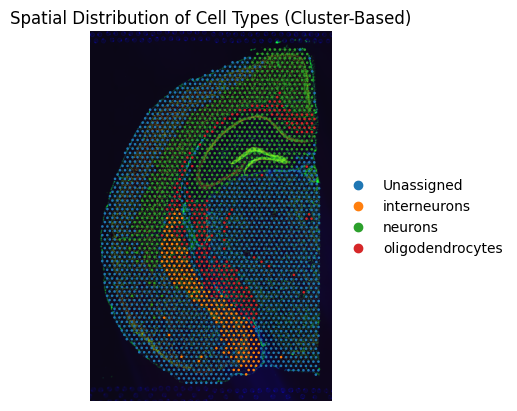

In [ ]:
import scanpy as sc
import pandas as pd


adata = sq.datasets.visium_fluo_adata()


sc.pp.filter_genes(adata, min_cells=3)
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

sc.tl.pca(adata, svd_solver='arpack')

sc.tl.leiden(adata, resolution=0.5)

# Define canonical marker genes for specific cell types
cell_types = {
    "astrocytes": ["Gfap", "Aqp4", "Slc1a3", "Aldh1l1", "Glul"],
    "neurons": ["Snap25", "Syt1", "Map2", "Camk2a", "Rbpms", "Tubb3"],
    "oligodendrocytes": ["Mbp", "Plp1", "Olig1", "Cnp", "Mag", "Mog"],
    "microglia": ["C1qa", "Trem2", "Iba1", "Cx3cr1", "Aif1"],
    "endothelial": ["Cdh5", "Pecam1", "Esam", "Clu", "Flt1", "Tie1"],
    "oligodendrocyte precursor cells (OPCs)": ["Pdgfra", "Cspg4", "Nkx2-2", "Olig2", "Cnp", "Plp1"],
    "interneurons": ["Gad1", "Gad2", "Sst", "Pvalb", "Vip", "Lhx6"],
    "excitatory neurons": ["Vglut1", "Vglut2", "Camk2a", "Pvalb", "Syt1"],
    "vascular smooth muscle cells": ["Acta2", "Myh11", "Tagln", "Sma", "Pdgfrb"],
    "ependymal cells": ["Rfx3", "Tmem67", "Foxj1", "Cldn1", "Pax6"],
    "choroid plexus epithelial cells": ["Slc22a18", "Sult1a1", "Hbb-bt", "Aqp1", "Klf4"]
}


# Perform differential expression testing to find top markers for each cluster
sc.tl.rank_genes_groups(adata, groupby="leiden", method="t-test", n_genes=20)

# Assign cell types based on marker genes found in clusters
cluster_labels = []
for cluster in adata.obs["leiden"].cat.categories:
    # Get top markers for the cluster
    top_genes = adata.uns["rank_genes_groups"]["names"][cluster][:10]
    top_genes = [g.lower() for g in top_genes]

    assigned = "Unassigned"
    for cell_type, markers in cell_types.items():
        # Check if any marker gene is in the top genes for the cluster
        if any(marker.lower() in top_genes for marker in markers):
            assigned = cell_type
            break
    cluster_labels.append((cluster, assigned))

# a dictionary of cluster labels
cluster_label_dict = {k: v for k, v in cluster_labels}

# Add the cell type labels to adata.obs
adata.obs["cell_type_label"] = adata.obs["leiden"].map(cluster_label_dict)

# Visualize the spatial distribution of cell types
sc.pl.spatial(
    adata,
    color="cell_type_label",
    title="Spatial Distribution of Cell Types (Cluster-Based)",
    size=1.8,
    legend_loc='right margin',
    frameon=False,
    legend_fontsize=10,
    ncols=1,
    spot_size=80
)


Epoch 1/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 6s 72ms/step - loss: 0.2185
Epoch 2/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 7s 106ms/step - loss: 0.1655
Epoch 3/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 4s 78ms/step - loss: 0.1624
Epoch 4/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 72ms/step - loss: 0.1599
Epoch 5/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 6s 99ms/step - loss: 0.1588
Epoch 6/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 4s 92ms/step - loss: 0.1584
Epoch 7/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 77ms/step - loss: 0.1576
Epoch 8/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 5s 74ms/step - loss: 0.1572
Epoch 9/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 6s 85ms/step - loss: 0.1572
Epoch 10/10
44/44 ━━━━━━━━━━━━━━━━━━━━ 3s 74ms/step - loss: 0.1575
88/88 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step


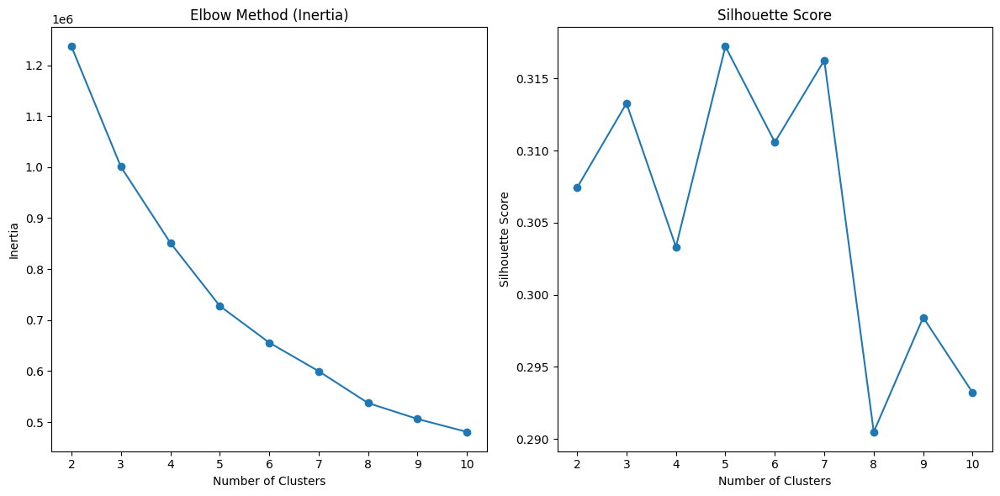

Optimal Number of Clusters based on Silhouette Score: 5


In [ ]:
import scanpy as sc
import numpy as np
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

# Load spatial transcriptomics data
adata = sq.datasets.visium_fluo_adata()

# Preprocess and normalize the data
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

# Define Autoencoder Architecture to extract latent features
from tensorflow.keras import layers, models

input_dim = adata.shape[1]
latent_dim = 64

# Autoencoder Architecture
inputs = layers.Input(shape=(input_dim,))
x = layers.Dense(128, activation='relu')(inputs)
x = layers.Dense(64, activation='relu')(x)
latent = layers.Dense(latent_dim)(x)

# Decoder
x = layers.Dense(64, activation='relu')(latent)
x = layers.Dense(128, activation='relu')(x)
decoded = layers.Dense(input_dim, activation='sigmoid')(x)

# Autoencoder Model
autoencoder = models.Model(inputs, decoded)
encoder = models.Model(inputs, latent)
autoencoder.compile(optimizer='adam', loss='mse')

# Convert sparse matrix to dense matrix
adata_X_dense = adata.X.toarray()

# Train the Autoencoder
autoencoder.fit(adata_X_dense, adata_X_dense, epochs=10, batch_size=64)

# Get the latent space
latent_features = encoder.predict(adata_X_dense)

# Elbow Method: Inertia vs Number of Clusters
inertia = []
sil_scores = []

# Try different numbers of clusters
max_clusters = 10
for k in range(2, max_clusters + 1):
    kmeans = KMeans(n_clusters=k, random_state=42)
    kmeans.fit(latent_features)
    inertia.append(kmeans.inertia_)
    sil_scores.append(silhouette_score(latent_features, kmeans.labels_))

# Plot Elbow Method (Inertia vs Number of Clusters)
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(range(2, max_clusters + 1), inertia, marker='o')
plt.title('Elbow Method (Inertia)')
plt.xlabel('Number of Clusters')
plt.ylabel('Inertia')

# Plot Silhouette Score vs Number of Clusters
plt.subplot(1, 2, 2)
plt.plot(range(2, max_clusters + 1), sil_scores, marker='o')
plt.title('Silhouette Score')
plt.xlabel('Number of Clusters')
plt.ylabel('Silhouette Score')

plt.tight_layout()
plt.show()

# Choose the optimal number of clusters based on elbow and silhouette score
optimal_clusters = np.argmax(sil_scores) + 2
print(f"Optimal Number of Clusters based on Silhouette Score: {optimal_clusters}")


/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


0.00B [00:00, ?B/s]

0.00B [00:00, ?B/s]

0.00B [00:00, ?B/s]

  0%|          | 0/100 [00:00<?, ?permutation/s]

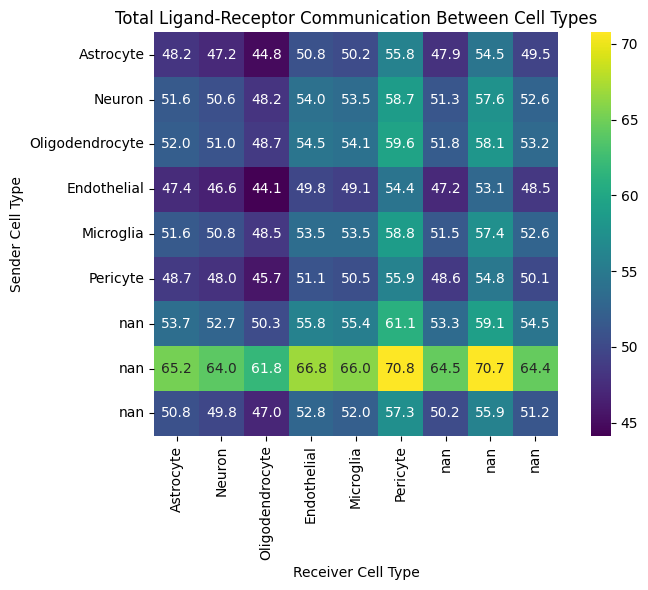

<ipython-input-23-2ae20b933c61>:105: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


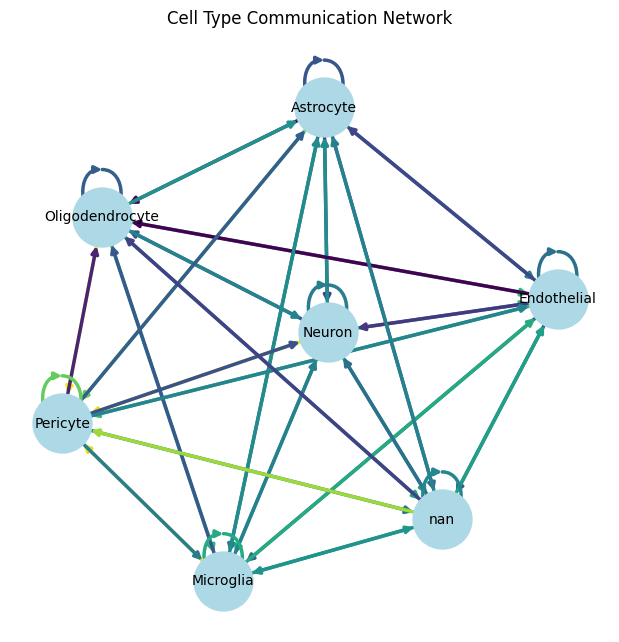

In [ ]:

import squidpy as sq
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx


adata = sq.datasets.visium_fluo_adata()
adata.var_names_make_unique()

# Normalize & preprocess
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)
adata = adata[:, adata.var.highly_variable]
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.leiden(adata, resolution=0.3, key_added="leiden_lowres")


#  Compute spatial neighbors & ligand-receptor interactions

sq.gr.spatial_neighbors(adata)

# Run ligand-receptor analysis
sq.gr.ligrec(adata, cluster_key="leiden_lowres", n_perms=100, use_raw=False)


# Map clusters to cell types

cluster_to_celltype = {
    "0": "Astrocyte",
    "1": "Neuron",
    "2": "Oligodendrocyte",
    "3": "Endothelial",
    "4": "Microglia",
    "5": "Pericyte",
}


#  Extract total communication matrix

ligrec_key = "leiden_lowres_ligrec"
means = adata.uns[ligrec_key]["means"]
cluster_communication = means.sum(axis=0).unstack()

# Convert indices to string for mapping
cluster_communication.index = cluster_communication.index.astype(str)
cluster_communication.columns = cluster_communication.columns.astype(str)

# Map cluster numbers to biological cell types
cluster_communication.index = cluster_communication.index.map(cluster_to_celltype)
cluster_communication.columns = cluster_communication.columns.map(cluster_to_celltype)

# Drop missing mappings
cluster_communication.dropna(axis=0, inplace=True)
cluster_communication.dropna(axis=1, inplace=True)


#  Plot heatmap of communication

plt.figure(figsize=(8, 6))
sns.heatmap(cluster_communication, cmap="viridis", annot=True, fmt=".1f", square=True)
plt.title("Total Ligand-Receptor Communication Between Cell Types")
plt.xlabel("Receiver Cell Type")
plt.ylabel("Sender Cell Type")
plt.tight_layout()
plt.show()


# Network graph of communication

G = nx.DiGraph()

# Add edges with communication strength > 0.5
for (sender, receiver), value in cluster_communication.stack().items():
    if value > 0.5:
        G.add_edge(sender, receiver, weight=value)

# Draw network graph
plt.figure(figsize=(6, 6))
pos = nx.spring_layout(G, seed=42)
weights = [d["weight"] for _, _, d in G.edges(data=True)]

nx.draw(
    G, pos,
    with_labels=True,
    node_color="lightblue",
    edge_color=weights,
    edge_cmap=plt.cm.viridis,
    node_size=1800,
    width=2.5,
    arrows=True,
    font_size=10
)
plt.title("Cell Type Communication Network")
plt.tight_layout()
plt.show()


/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


  0%|          | 0/100 [00:00<?, ?permutation/s]

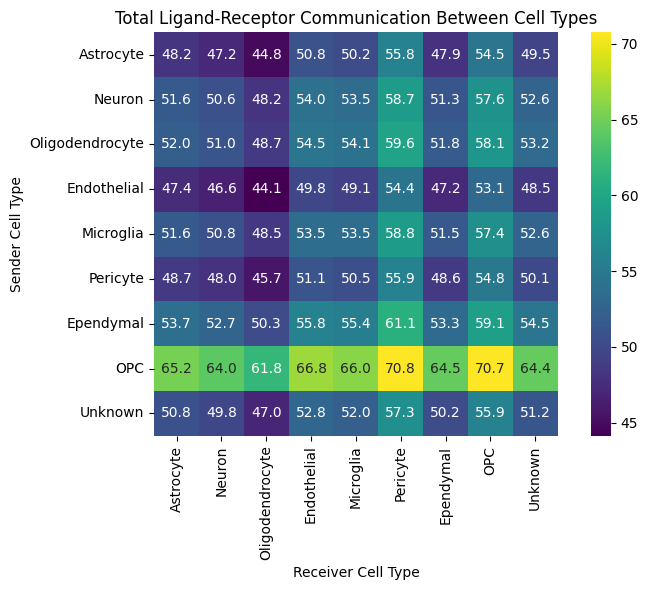

<ipython-input-25-d340e30d75a8>:108: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


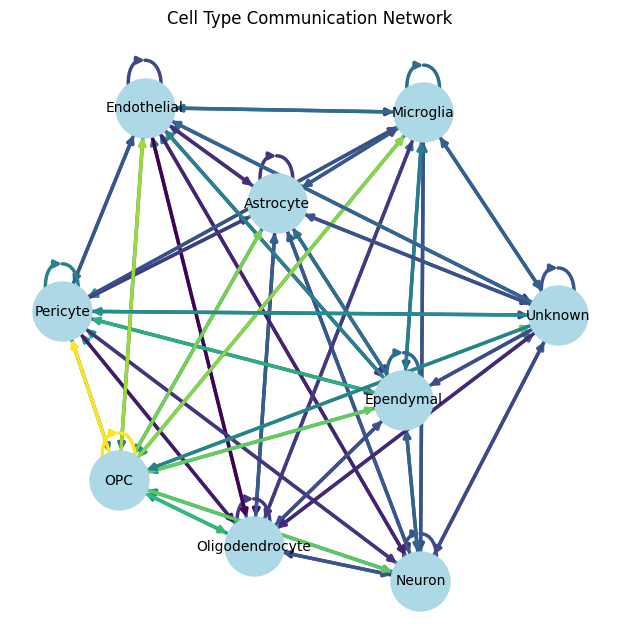

In [ ]:
import squidpy as sq
import scanpy as sc
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx

adata = sq.datasets.visium_fluo_adata()
adata.var_names_make_unique()

# Normalize & preprocess
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)
adata = adata[:, adata.var.highly_variable]
sc.pp.pca(adata)
sc.pp.neighbors(adata)
sc.tl.leiden(adata, resolution=0.3, key_added="leiden_lowres")


#  Compute spatial neighbors & ligand-receptor interactions

sq.gr.spatial_neighbors(adata)

# Run ligand-receptor analysis
sq.gr.ligrec(adata, cluster_key="leiden_lowres", n_perms=100, use_raw=False)


# Map clusters to cell types

# generate cluster-cell type map
unique_clusters = sorted(adata.obs["leiden_lowres"].unique())
cluster_to_celltype = {
    str(cl): name for cl, name in zip(unique_clusters, [
        "Astrocyte", "Neuron", "Oligodendrocyte", "Endothelial",
        "Microglia", "Pericyte", "Ependymal", "OPC", "Unknown"
    ])
}
# Pad with generic names if more clusters
for cl in unique_clusters:
    if str(cl) not in cluster_to_celltype:
        cluster_to_celltype[str(cl)] = f"Cluster_{cl}"


# Extract total communication matrix

ligrec_key = "leiden_lowres_ligrec"
means = adata.uns[ligrec_key]["means"]
cluster_communication = means.sum(axis=0).unstack()

# Convert indices to string for mapping
cluster_communication.index = cluster_communication.index.astype(str)
cluster_communication.columns = cluster_communication.columns.astype(str)

# Map cluster numbers to biological cell types
cluster_communication.index = cluster_communication.index.map(cluster_to_celltype)
cluster_communication.columns = cluster_communication.columns.map(cluster_to_celltype)

# Drop any remaining NaNs (shouldn't occur now)
cluster_communication.dropna(axis=0, inplace=True)
cluster_communication.dropna(axis=1, inplace=True)


#  Plot heatmap of communication

plt.figure(figsize=(8, 6))
sns.heatmap(cluster_communication, cmap="viridis", annot=True, fmt=".1f", square=True)
plt.title("Total Ligand-Receptor Communication Between Cell Types")
plt.xlabel("Receiver Cell Type")
plt.ylabel("Sender Cell Type")
plt.tight_layout()
plt.show()


# Network graph of communication

G = nx.DiGraph()

# Add edges with communication strength > 0.5
for (sender, receiver), value in cluster_communication.stack().items():
    if value > 0.5:
        G.add_edge(sender, receiver, weight=value)

# Draw network graph
plt.figure(figsize=(6, 6))
pos = nx.spring_layout(G, seed=42)
weights = [d["weight"] for _, _, d in G.edges(data=True)]

nx.draw(
    G, pos,
    with_labels=True,
    node_color="lightblue",
    edge_color=weights,
    edge_cmap=plt.cm.viridis,
    node_size=1800,
    width=2.5,
    arrows=True,
    font_size=10
)
plt.title("Cell Type Communication Network")
plt.tight_layout()
plt.show()


In [ ]:
pip install squidpy scanpy torch torchvision torch-geometric


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 2.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 20.0 MB/s eta 0:00:00


In [ ]:
# Compute spatial neighbors
sq.gr.spatial_neighbors(adata)

# Extract the adjacency matrix
adjacency = adata.obsp["spatial_connectivities"]


In [ ]:
import torch
from torch_geometric.data import Data
from torch_geometric.utils import from_scipy_sparse_matrix

# Feature matrix
features = torch.tensor(adata.X.toarray(), dtype=torch.float)

# Edge index from adjacency matrix
edge_index, _ = from_scipy_sparse_matrix(adjacency)

# Create PyTorch Geometric data object
data = Data(x=features, edge_index=edge_index)


In [ ]:
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GCNConv

class AGC(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super(AGC, self).__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = F.relu(self.conv1(x, edge_index))
        x = self.conv2(x, edge_index)
        return x


In [ ]:
# Initialize model
model = AGC(in_channels=features.shape[1], hidden_channels=64, out_channels=10)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

# Training loop
model.train()
for epoch in range(200):
    optimizer.zero_grad()
    out = model(data.x, data.edge_index)
    loss = F.mse_loss(out, out)
    loss.backward()
    optimizer.step()
    if epoch % 20 == 0:
        print(f'Epoch {epoch}, Loss: {loss.item()}')


Epoch 0, Loss: 0.0
Epoch 20, Loss: 0.0
Epoch 40, Loss: 0.0
Epoch 60, Loss: 0.0
Epoch 80, Loss: 0.0
Epoch 100, Loss: 0.0
Epoch 120, Loss: 0.0
Epoch 140, Loss: 0.0
Epoch 160, Loss: 0.0
Epoch 180, Loss: 0.0


In [ ]:
from sklearn.cluster import KMeans

model.eval()
embeddings = model(data.x, data.edge_index).detach().numpy()

# Perform KMeans clustering
kmeans = KMeans(n_clusters=5, random_state=0).fit(embeddings)
labels = kmeans.labels_

# Add labels to AnnData object
adata.obs['AGC_clusters'] = labels.astype(str)


<ipython-input-32-af211c1f8378>:6: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color='AGC_clusters', title='AGC Clusters on Tissue')


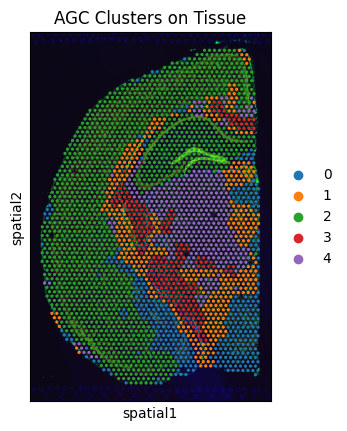

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns


# Spatial plot
sc.pl.spatial(adata, color='AGC_clusters', title='AGC Clusters on Tissue')


In [ ]:
# Clone the GALA repository
!git clone https://github.com/sseung0703/GALA_TF2.0.git
%cd GALA_TF2.0
!pip install tensorflow==2.0.0
!pip install scanpy squidpy

import squidpy as sq
import scanpy as sc
import numpy as np
import scipy.sparse
import os

adata = sq.datasets.visium_fluo_adata()
adata.var_names_make_unique()

# Preprocessing steps
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)
adata = adata[:, adata.var.highly_variable]
sc.pp.pca(adata)

# Compute spatial neighbors
sq.gr.spatial_neighbors(adata)

# Extract features and adjacency matrix
features = adata.X.toarray() if hasattr(adata.X, "toarray") else adata.X
adjacency = adata.obsp["spatial_connectivities"]

# Save features and adjacency matrix
os.makedirs("data/visium", exist_ok=True)
np.save("data/visium/features.npy", features)
scipy.sparse.save_npz("data/visium/adjacency.npz", adjacency)


Cloning into 'GALA_TF2.0'...
remote: Enumerating objects: 22, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 22 (delta 4), reused 9 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (22/22), 809.17 KiB | 11.08 MiB/s, done.
Resolving deltas: 100% (4/4), done.
/content/GALA_TF2.0
ERROR: Could not find a version that satisfies the requirement tensorflow==2.0.0 (from versions: 2.12.0rc0, 2.12.0rc1, 2.12.0, 2.12.1, 2.13.0rc0, 2.13.0rc1, 2.13.0rc2, 2.13.0, 2.13.1, 2.14.0rc0, 2.14.0rc1, 2.14.0, 2.14.1, 2.15.0rc0, 2.15.0rc1, 2.15.0, 2.15.0.post1, 2.15.1, 2.16.0rc0, 2.16.1, 2.16.2, 2.17.0rc0, 2.17.0rc1, 2.17.0, 2.17.1, 2.18.0rc0, 2.18.0rc1, 2.18.0rc2, 2.18.0, 2.18.1, 2.19.0rc0, 2.19.0)
ERROR: No matching distribution found for tensorflow==2.0.0


/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


In [ ]:
!python train.py


2025-04-16 20:36:16.695579: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744835776.730886   24926 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744835776.741619   24926 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-16 20:36:32.606357: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
Traceback (most recent call last):
  File "/content/GALA_TF2.0/train.py", line 57, in <module>
    tf.config.experimental.set_memory_growth(gpus[0], True)
                                             ~~~~^^^
IndexError: list index out of range


In [ ]:
from sklearn.cluster import KMeans
import numpy as np

# Load the embeddings
embeddings = np.load("/content/GALA_TF2.0/data/visium/features.npy")

# Perform KMeans clustering
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(embeddings)

# Add cluster labels
adata.obs["GALA_clusters"] = labels.astype(str)


<ipython-input-36-6a605ba745bc>:1: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color="GALA_clusters", size=1.5, title="GALA Clustering on Visium")


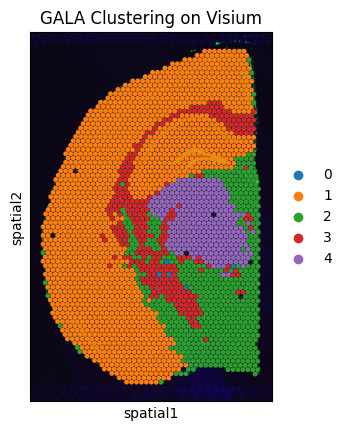

In [ ]:
sc.pl.spatial(adata, color="GALA_clusters", size=1.5, title="GALA Clustering on Visium")


Full GAT Model Pipeline

In [ ]:
!pip install scanpy squidpy torch torchvision torchaudio torch-geometric scikit-learn numpy matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 63.1/63.1 kB 1.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.8/87.8 kB 2.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of dask-expr to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of distributed to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 18.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.3/161.3 kB 8.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 24.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 20.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
import scanpy as sc
import squidpy as sq
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.data import Data
from torch_geometric.nn import GATConv
from sklearn.cluster import KMeans
import numpy as np

/usr/lib/python3.11/importlib/__init__.py:126: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  return _bootstrap._gcd_import(name[level:], package, level)
/usr/local/lib/python3.11/dist-packages/cudf/utils/_ptxcompiler.py:64: UserWarning: Error getting driver and runtime versions:

stdout:



stderr:

Traceback (most recent call last):
  File "<string>", line 4, in <module>
  File "/usr/local/lib/python3.11/dist-packages/numba_cuda/numba/cuda/cudadrv/driver.py", line 314, in __getattr__
    raise CudaSupportError("Error at driver init: \n%s:" %
numba.cuda.cudadrv.error.CudaSupportError: Error at driver init: 

CUDA driver library cannot be found.
If you are sure that a CUDA driver is installed,
try setting environment variable NUMBA_CUDA_DRIVER
with the file path of the CUDA d

  0%|          | 0.00/242M [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


Epoch 0, Loss: 1.9657
Epoch 50, Loss: 0.0905
Epoch 100, Loss: 0.0469
Epoch 150, Loss: 0.0375
Epoch 200, Loss: 0.0285
Epoch 250, Loss: 0.0239


<ipython-input-4-9728390c640c>:53: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color="deep_cluster_gat", title="Deep Clusters (GAT)")


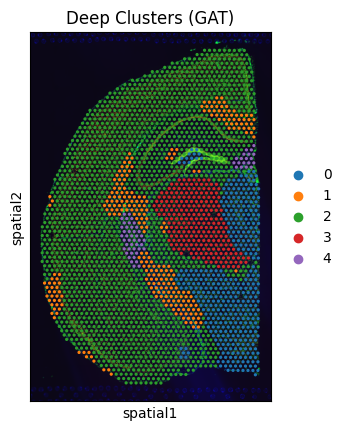

In [ ]:

adata = sq.datasets.visium_fluo_adata()
adata.raw = adata
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=2000, flavor="seurat")
adata = adata[:, adata.var.highly_variable]
sc.pp.pca(adata, n_comps=30)
sc.pp.neighbors(adata)
sq.gr.spatial_neighbors(adata, coord_type="grid")

# Features and spatial graph
features = torch.tensor(adata.obsm["X_pca"], dtype=torch.float)
edge_index = torch.tensor(np.array(adata.obsp["spatial_connectivities"].nonzero()), dtype=torch.long)

# Define GAT Encoder
class GATEncoder(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.gat1 = GATConv(in_channels, 128, heads=4, concat=True)
        self.gat2 = GATConv(512, 128, heads=2, concat=True)
        self.gat3 = GATConv(256, out_channels, heads=1)

    def forward(self, x, edge_index):
        x = F.elu(self.gat1(x, edge_index))
        x = F.elu(self.gat2(x, edge_index))
        x = self.gat3(x, edge_index)
        return x

# Train the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
data = Data(x=features, edge_index=edge_index).to(device)
model = GATEncoder(in_channels=features.shape[1], out_channels=32).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.005, weight_decay=1e-4)

model.train()
for epoch in range(300):
    optimizer.zero_grad()
    out = model(data.x, data.edge_index)
    loss = out.norm(p=2, dim=1).mean()
    loss.backward()
    optimizer.step()
    if epoch % 50 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item():.4f}")

# Cluster embeddings
model.eval()
embeddings = model(data.x, data.edge_index).detach().cpu().numpy()
kmeans = KMeans(n_clusters=5, random_state=0).fit(embeddings)
adata.obs["deep_cluster_gat"] = kmeans.labels_.astype(str)

# Visualize
sc.pl.spatial(adata, color="deep_cluster_gat", title="Deep Clusters (GAT)")

Full GCN Model Pipeline


In [ ]:
from torch_geometric.nn import GCNConv

/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


Epoch 0, Loss: 2.6853
Epoch 50, Loss: 0.1266
Epoch 100, Loss: 0.0340
Epoch 150, Loss: 0.0162


<ipython-input-10-75bd423c2951>:51: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color="deep_cluster_gcn", title="Deep Clusters (GCN)")


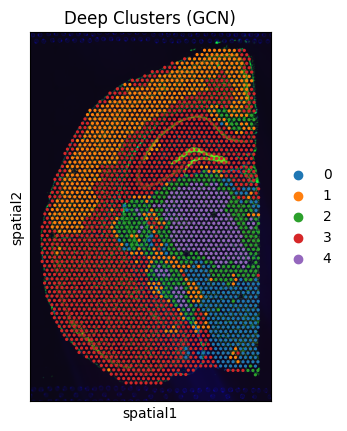

In [ ]:
# Load and preprocess data
adata = sq.datasets.visium_fluo_adata()
adata.raw = adata
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=2000, flavor="seurat")
adata = adata[:, adata.var.highly_variable]
sc.pp.pca(adata, n_comps=30)
sc.pp.neighbors(adata)
sq.gr.spatial_neighbors(adata, coord_type="grid")

# Features and spatial graph
features = torch.tensor(adata.obsm["X_pca"], dtype=torch.float)
edge_index = torch.tensor(np.array(adata.obsp["spatial_connectivities"].nonzero()), dtype=torch.long)

# Define GCN Encoder
class GCNEncoder(nn.Module):
    def __init__(self, in_channels, out_channels=32):
        super().__init__()
        self.conv1 = GCNConv(in_channels, 64)
        self.conv2 = GCNConv(64, out_channels)

    def forward(self, x, edge_index):
        x = F.relu(self.conv1(x, edge_index))
        x = self.conv2(x, edge_index)
        return x

# Train the model
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
data = Data(x=features, edge_index=edge_index).to(device)
model = GCNEncoder(in_channels=features.shape[1]).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.005)

model.train()
for epoch in range(200):
    optimizer.zero_grad()
    out = model(data.x, data.edge_index)
    loss = out.norm(p=2, dim=1).mean()
    loss.backward()
    optimizer.step()
    if epoch % 50 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item():.4f}")

# Cluster embeddings
model.eval()
embeddings = model(data.x, data.edge_index).detach().cpu().numpy()
kmeans = KMeans(n_clusters=5, random_state=0).fit(embeddings)
adata.obs["deep_cluster_gcn"] = kmeans.labels_.astype(str)

# Visualize
sc.pl.spatial(adata, color="deep_cluster_gcn", title="Deep Clusters (GCN)")

DGI-Based Deep Graph Clustering (5 Clusters)

In [ ]:
from torch_geometric.nn import GCNConv
from torch_geometric.nn.models import DeepGraphInfomax

/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


Epoch 0, Loss: 1.6708
Epoch 50, Loss: 0.8812
Epoch 100, Loss: 0.2228
Epoch 150, Loss: 0.0818


<ipython-input-12-50dd5ad26323>:61: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color="deep_cluster_dgi", title="Deep Clusters (DGI)")


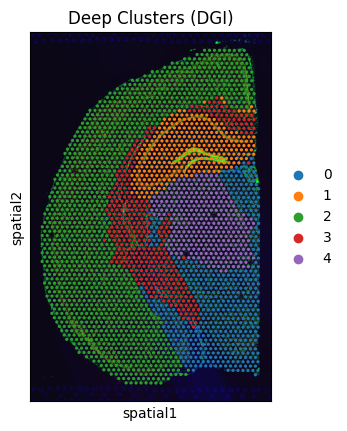

In [ ]:
adata = sq.datasets.visium_fluo_adata()
adata.raw = adata
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=2000, flavor="seurat")
adata = adata[:, adata.var.highly_variable]
sc.pp.pca(adata, n_comps=30)
sc.pp.neighbors(adata)
sq.gr.spatial_neighbors(adata, coord_type="grid")

# Build features and graph
features = torch.tensor(adata.obsm["X_pca"], dtype=torch.float)
edge_index = torch.tensor(np.array(adata.obsp["spatial_connectivities"].nonzero()), dtype=torch.long)
data = Data(x=features, edge_index=edge_index)

# Define encoder
class GCNEncoder(nn.Module):
    def __init__(self, in_channels, out_channels=64):
        super().__init__()
        self.conv = GCNConv(in_channels, out_channels)

    def forward(self, x, edge_index):
        x = self.conv(x, edge_index)
        return F.prelu(x, torch.tensor(0.25))

# Define DGI model
encoder = GCNEncoder(in_channels=features.shape[1])
dgi_model = DeepGraphInfomax(
    hidden_channels=64,
    encoder=encoder,
    summary=lambda z, *args, **kwargs: torch.sigmoid(z.mean(dim=0)),
    corruption=lambda x, edge_index: (x[torch.randperm(x.size(0))], edge_index),
)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = dgi_model.to(device)
data = data.to(device)

# Train DGI
optimizer = torch.optim.Adam(model.parameters(), lr=0.001)
model.train()
for epoch in range(200):
    optimizer.zero_grad()
    pos_z, neg_z, summary = model(data.x, data.edge_index)
    loss = model.loss(pos_z, neg_z, summary)
    loss.backward()
    optimizer.step()
    if epoch % 50 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item():.4f}")

# Extract embeddings and cluster
model.eval()
with torch.no_grad():
    z = model.encoder(data.x, data.edge_index).detach().cpu().numpy()

kmeans = KMeans(n_clusters=5, random_state=0).fit(z)
adata.obs["deep_cluster_dgi"] = kmeans.labels_.astype(str)

# Visualize clusters
sc.pl.spatial(adata, color="deep_cluster_dgi", title="Deep Clusters (DGI)")

In [ ]:
!pip install igraph leidenalg

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.0/2.0 MB 10.7 MB/s eta 0:00:00


/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca
<ipython-input-17-7c10415d813b>:19: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.5)


Top genes per cell type:
Type_0: ['Gm42418', 'Fth1', 'Camk2n1', 'Nrgn', 'Rps29']
Type_1: ['Gm42418', 'Fth1', 'Rps29', 'Camk2n1', 'Mbp']
Type_10: ['Gm42418', 'Ttr', 'Fth1', 'Dbi', 'Mbp']
Type_2: ['Gm42418', 'Fth1', 'Mbp', 'Plp1', 'Sparcl1']
Type_3: ['Gm42418', 'Fth1', 'Nrgn', 'Rps29', 'Slc1a2']
Type_4: ['Gm42418', 'Mbp', 'Plp1', 'Pcp4', 'Fth1']
Type_5: ['Plp1', 'Mbp', 'Fth1', 'Gm42418', 'Mobp']
Type_6: ['Gm42418', 'Fth1', 'Mbp', 'Plp1', 'Rps29']
Type_7: ['Gm42418', 'Ptgds', 'Fth1', 'Hbb-bs', 'Sparcl1']
Type_8: ['Gm42418', 'Ttr', 'Fth1', 'Mbp', 'Plp1']
Type_9: ['Gm42418', 'Fth1', 'Mbp', 'Plp1', 'Sparcl1']


<ipython-input-17-7c10415d813b>:40: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=all_top_genes, cmap="viridis", ncols=5, size=1.4, title="Top Cell Type-Specific Genes")


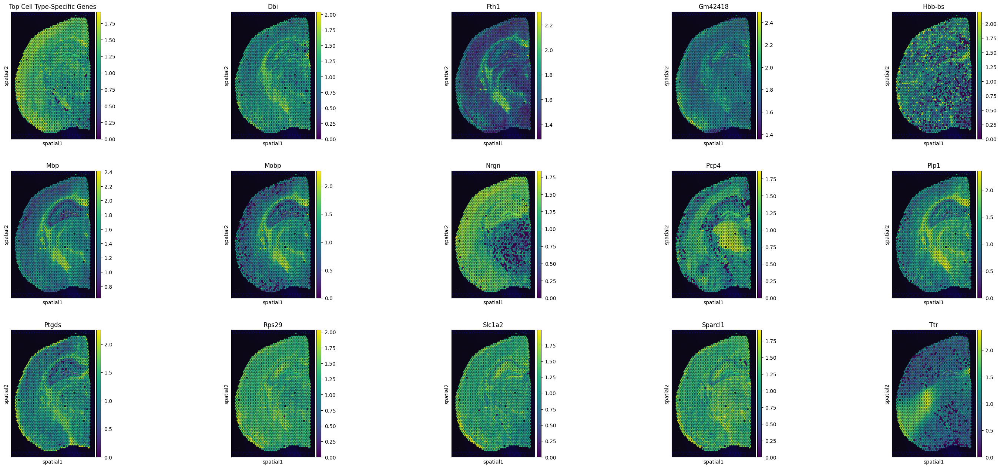

       Gene Top_Cell_Type  Avg_Expression
0   Gm42418        Type_0        1.804419
1      Fth1        Type_0        1.529046
2   Camk2n1        Type_0        1.445154
3      Nrgn        Type_0        1.444617
4     Rps29        Type_0        1.359824
9       Mbp        Type_1        1.427609
11      Ttr       Type_10        1.684365
13      Dbi       Type_10        1.605916
18     Plp1        Type_2        1.520761
19  Sparcl1        Type_2        1.386182
24   Slc1a2        Type_3        1.359093
28     Pcp4        Type_4        1.580206
34     Mobp        Type_5        1.838382
41    Ptgds        Type_7        1.820537
43   Hbb-bs        Type_7        1.582971


In [ ]:
import scanpy as sc
import squidpy as sq
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

adata = sq.datasets.visium_fluo_adata()
adata.raw = adata
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)
adata = adata[:, adata.var.highly_variable]
sc.pp.pca(adata, n_comps=30)
sc.pp.neighbors(adata)

sc.tl.leiden(adata, resolution=0.5)
adata.obs["cell_type"] = "Type_" + adata.obs["leiden"].astype(str)

# Compute average expression per gene per cell type
cell_type_avg = sc.get.obs_df(adata, keys=list(adata.var_names), layer=None, use_raw=True)
cell_type_avg["cell_type"] = adata.obs["cell_type"].values
avg_by_type = cell_type_avg.groupby("cell_type").mean().T

# top 5 genes per cell type
top_genes_per_type = {}
for cell_type in avg_by_type.columns:
    top_genes = avg_by_type[cell_type].sort_values(ascending=False).head(5)
    top_genes_per_type[cell_type] = list(top_genes.index)

# Flatten top genes across all cell types
all_top_genes = sorted(set(g for genes in top_genes_per_type.values() for g in genes))
print("Top genes per cell type:")
for k, v in top_genes_per_type.items():
    print(f"{k}: {v}")

# Visualize all top genes
sc.pl.spatial(adata, color=all_top_genes, cmap="viridis", ncols=5, size=1.4, title="Top Cell Type-Specific Genes")
# Create gene to cell type mapping
gene_to_type = []
for cell_type, genes in top_genes_per_type.items():
    for gene in genes:
        avg_expr = avg_by_type.loc[gene, cell_type]
        gene_to_type.append({
            "Gene": gene,
            "Top_Cell_Type": cell_type,
            "Avg_Expression": avg_expr
        })

# Convert to DataFrame
gene_summary_df = pd.DataFrame(gene_to_type)
gene_summary_df = gene_summary_df.drop_duplicates(subset=["Gene"])

# Sort by cell type and expression
gene_summary_df = gene_summary_df.sort_values(by=["Top_Cell_Type", "Avg_Expression"], ascending=[True, False])

# Display
print(gene_summary_df)

In [ ]:
import networkx as nx
from networkx import from_scipy_sparse_array
import squidpy as sq

# Ensure spatial graph exists
if "spatial_connectivities" not in adata.obsp:
    sq.gr.spatial_neighbors(adata, coord_type="grid")

# Build graph
G = from_scipy_sparse_array(adata.obsp["spatial_connectivities"])

# Compute betweenness centrality
centrality_dict = nx.betweenness_centrality(G)
centrality_scores = [centrality_dict.get(i, 0) for i in range(adata.n_obs)]

# Store in adata.obs
adata.obs["global_centrality"] = centrality_scores

Marker genes found per cell type:
astrocytes: ['Aqp4', 'Gfap', 'Slc1a3', 'Aldh1l1']
neurons: ['Camk2a']
oligodendrocytes: ['Mbp', 'Plp1', 'Mobp', 'Cnp']
microglia: ['C1qa', 'Trem2', 'Aif1', 'Cx3cr1']
endothelial: ['Flt1']
ependymal: ['Foxj1']
pericytes: ['Rgs5']
OPCs: ['Pdgfra', 'Cspg4']
vascular_smooth_muscle: ['Acta2', 'Tagln']


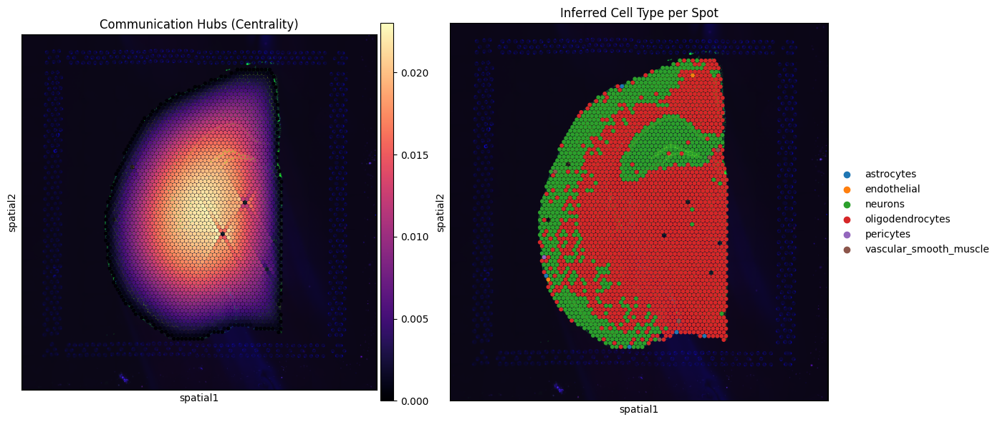

In [ ]:
import matplotlib.pyplot as plt
import squidpy as sq

# Define expanded marker genes for brain cell types
cell_type_markers = {
    'astrocytes': ['Aqp4', 'Gfap', 'Slc1a3', 'Aldh1l1'],
    'neurons': ['Snap25', 'Syt1', 'Rbfox3', 'Tubb3', 'Camk2a'],
    'oligodendrocytes': ['Mbp', 'Plp1', 'Mobp', 'Cnp'],
    'microglia': ['C1qa', 'Trem2', 'Aif1', 'Cx3cr1'],
    'endothelial': ['Cdh5', 'Pecam1', 'Flt1', 'Kdr'],
    'ependymal': ['Foxj1', 'Dnah5'],
    'pericytes': ['Rgs5', 'Pdgfrb'],
    'OPCs': ['Pdgfra', 'Cspg4'],
    'vascular_smooth_muscle': ['Acta2', 'Tagln']
}

# Filter genes present in the dataset
filtered_markers = {
    ct: [g for g in genes if g in adata.var_names]
    for ct, genes in cell_type_markers.items()
}
print("Marker genes found per cell type:")
for ct, genes in filtered_markers.items():
    print(f"{ct}: {genes}")

# Score each spot by average expression of marker genes
for cell_type, genes in filtered_markers.items():
    if genes:
        adata.obs[cell_type + '_score'] = adata[:, genes].X.mean(axis=1)
    else:
        adata.obs[cell_type + '_score'] = 0.0

# Assign most likely cell type to each spot
cell_type_cols = [ct + '_score' for ct in filtered_markers]
adata.obs['cell_type'] = adata.obs[cell_type_cols].idxmax(axis=1).str.replace('_score', '')

# Overlay centrality  and cell type
fig, ax = plt.subplots(1, 2, figsize=(14, 6))

# Plot centrality
sq.pl.spatial_scatter(
    adata,
    color='global_centrality',
    size=1.5,
    ax=ax[0],
    cmap='magma',
    title='Communication Hubs (Centrality)'
)

# Plot assigned cell types
sq.pl.spatial_scatter(
    adata,
    color='cell_type',
    size=1.5,
    ax=ax[1],
    title='Inferred Cell Type per Spot'
)

plt.tight_layout()
plt.show()

In [ ]:
# Clone official DFCN repo
!git clone https://github.com/WxTu/DFCN.git
%cd DFCN

!pip install scanpy squidpy
!pip install torch torchvision
!sed -i '/argparse/d' DFCN.py


Cloning into 'DFCN'...
remote: Enumerating objects: 304, done.
remote: Counting objects: 100% (46/46), done.
remote: Compressing objects: 100% (45/45), done.
remote: Total 304 (delta 26), reused 5 (delta 1), pack-reused 258 (from 1)
Receiving objects: 100% (304/304), 27.98 MiB | 21.21 MiB/s, done.
Resolving deltas: 100% (161/161), done.
/content/GALA_TF2.0/DFCN


/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


Epoch 0, Loss: 0.1237
Epoch 10, Loss: 0.0603
Epoch 20, Loss: 0.0538
Epoch 30, Loss: 0.0528
Epoch 40, Loss: 0.0524
Epoch 50, Loss: 0.0521
Epoch 60, Loss: 0.0513
Epoch 70, Loss: 0.0491
Epoch 80, Loss: 0.0478
Epoch 90, Loss: 0.0464


<ipython-input-39-929dbfb7a2c7>:93: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color="dfcn_cluster_5", size=1.5, title="DFCN (5 Clusters)")


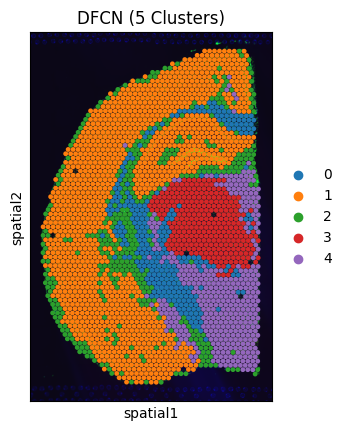

Saved cluster labels to data/visium/dfcn_pred.npy and AnnData to dfcn_visium_5clusters.h5ad


In [ ]:
import sys
sys.path.append('/content/DFCN')

import os
import numpy as np
import scanpy as sc
import squidpy as sq
import scipy.sparse

adata = sq.datasets.visium_fluo_adata()
adata.var_names_make_unique()

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)
adata = adata[:, adata.var.highly_variable]
sc.pp.pca(adata)
sq.gr.spatial_neighbors(adata)

features = adata.X.toarray() if hasattr(adata.X, "toarray") else adata.X
adj = adata.obsp["spatial_connectivities"].todense()
labels = np.zeros(adata.n_obs)


# Define simplified DFCN model

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.optim import Adam
from sklearn.cluster import KMeans

class AE(nn.Module):
    def __init__(self, n_input, n_z):
        super().__init__()
        self.encoder = nn.Sequential(
            nn.Linear(n_input, 512), nn.ReLU(),
            nn.Linear(512, 256), nn.ReLU(),
            nn.Linear(256, n_z)
        )
        self.decoder = nn.Sequential(
            nn.Linear(n_z, 256), nn.ReLU(),
            nn.Linear(256, 512), nn.ReLU(),
            nn.Linear(512, n_input)
        )

    def forward(self, x):
        z = self.encoder(x)
        x_bar = self.decoder(z)
        return x_bar, z

class DFCN(nn.Module):
    def __init__(self, n_input, n_clusters=5, n_z=64):
        super().__init__()
        self.n_clusters = n_clusters
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        self.ae = AE(n_input, n_z).to(self.device)

    def fit(self, features, verbose=True):
        x = torch.FloatTensor(features).to(self.device)
        optimizer = Adam(self.ae.parameters(), lr=1e-3)

        self.ae.train()
        for epoch in range(100):
            x_bar, z = self.ae(x)
            loss = F.mse_loss(x_bar, x)
            optimizer.zero_grad()
            loss.backward()
            optimizer.step()
            if verbose and epoch % 10 == 0:
                print(f"Epoch {epoch}, Loss: {loss.item():.4f}")

        self.z = self.ae.encoder(x).detach().cpu().numpy()
        self.kmeans = KMeans(n_clusters=self.n_clusters, n_init=20).fit(self.z)
        self.labels_ = self.kmeans.labels_

    def predict(self):
        return self.labels_


# Train and visualize

model = DFCN(n_input=features.shape[1], n_clusters=5, n_z=64)
model.fit(features)
pred = model.predict()

adata.obs["dfcn_cluster_5"] = pred.astype(str)
sc.pl.spatial(adata, color="dfcn_cluster_5", size=1.5, title="DFCN (5 Clusters)")


os.makedirs("data/visium", exist_ok=True)
pred_path = "data/visium/dfcn_pred.npy"
h5ad_path = "dfcn_visium_5clusters.h5ad"

np.save(pred_path, pred)
adata.write(h5ad_path)
print(f"Saved cluster labels to {pred_path} and AnnData to {h5ad_path}")


/usr/lib/python3.11/importlib/__init__.py:126: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  return _bootstrap._gcd_import(name[level:], package, level)
/usr/local/lib/python3.11/dist-packages/cudf/utils/_ptxcompiler.py:64: UserWarning: Error getting driver and runtime versions:

stdout:



stderr:

Traceback (most recent call last):
  File "<string>", line 4, in <module>
  File "/usr/local/lib/python3.11/dist-packages/numba_cuda/numba/cuda/cudadrv/driver.py", line 314, in __getattr__
    raise CudaSupportError("Error at driver init: \n%s:" %
numba.cuda.cudadrv.error.CudaSupportError: Error at driver init: 

CUDA driver library cannot be found.
If you are sure that a CUDA driver is installed,
try setting environment variable NUMBA_CUDA_DRIVER
with the file path of the CUDA d

  0%|          | 0.00/242M [00:00<?, ?B/s]

<ipython-input-4-b278cac90a3c>:18: FutureWarning: In the future, the default backend for leiden will be igraph instead of leidenalg.

 To achieve the future defaults please pass: flavor="igraph" and n_iterations=2.  directed must also be False to work with igraph's implementation.
  sc.tl.leiden(adata, resolution=0.5)


/usr/local/lib/python3.11/dist-packages/scanpy/tools/_rank_genes_groups.py:481: RuntimeWarning: overflow encountered in expm1
  foldchanges = (self.expm1_func(mean_group) + 1e-9) / (
<ipython-input-4-b278cac90a3c>:85: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(


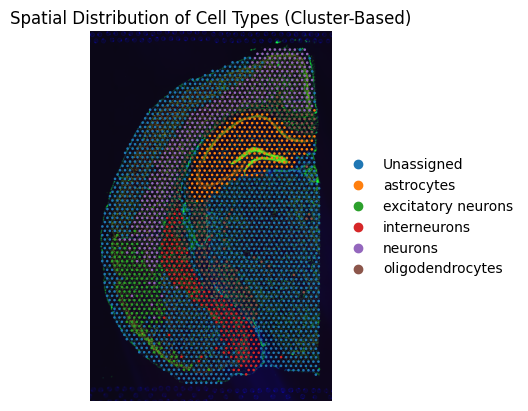

In [ ]:
import scanpy as sc
import squidpy as sq
import pandas as pd


adata = sq.datasets.visium_fluo_adata()

sc.pp.filter_genes(adata, min_cells=3)
sc.pp.filter_cells(adata, min_genes=200)
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)
sc.tl.pca(adata, svd_solver='arpack')

# Perform clustering
sc.tl.leiden(adata, resolution=0.5)

# Define canonical marker genes for specific cell types
cell_types = {
    "astrocytes": [
        "Gfap", "Aqp4", "Slc1a3", "Aldh1l1", "Glul", "S100b", "Sparcl1", "Fabp7", "Fgfr3", "Slc1a2"
    ],
    "neurons": [
        "Snap25", "Syt1", "Map2", "Camk2a", "Rbpms", "Tubb3", "Neun", "Syn1", "Rbfox3", "Gria1"
    ],
    "oligodendrocytes": [
        "Mbp", "Plp1", "Olig1", "Cnp", "Mag", "Mog", "Mobp", "Enpp6", "Gjc2", "Sox10"
    ],
    "microglia": [
        "C1qa", "Trem2", "Iba1", "Cx3cr1", "Aif1", "Itgam", "Hexb", "P2ry12", "Csf1r", "Tyrobp"
    ],
    "endothelial": [
        "Cdh5", "Pecam1", "Esam", "Clu", "Flt1", "Tie1", "Tek", "Itm2a", "Emcn", "Kdr"
    ],
    "oligodendrocyte precursor cells (OPCs)": [
        "Pdgfra", "Cspg4", "Nkx2-2", "Olig2", "Cnp", "Plp1", "Ptprz1", "Sox10", "Fyn", "Tnr"
    ],
    "interneurons": [
        "Gad1", "Gad2", "Sst", "Pvalb", "Vip", "Lhx6", "Calb2", "Npy", "Nos1", "Tac1"
    ],
    "excitatory neurons": [
        "Vglut1", "Vglut2", "Camk2a", "Pvalb", "Syt1", "Grin1", "Slc17a7", "Neurod6", "Satb2", "Bcl11b"
    ],
    "vascular smooth muscle cells": [
        "Acta2", "Myh11", "Tagln", "Sma", "Pdgfrb", "Des", "Cnn1", "Rgs5", "Myl9", "Itga8"
    ],
    "ependymal cells": [
        "Rfx3", "Tmem67", "Foxj1", "Cldn1", "Pax6", "Tmem212", "Dnah9", "S100b", "Ccdc153", "Dnah5"
    ],
    "choroid plexus epithelial cells": [
        "Slc22a18", "Sult1a1", "Hbb-bt", "Aqp1", "Klf4", "Ttr", "Folr1", "Kcne2", "Enpp2", "Otx2"
    ]
}



# Perform differential expression testing to find top markers for each cluster
sc.tl.rank_genes_groups(adata, groupby="leiden", method="t-test", n_genes=20)

# Assign cell types based on marker genes found in clusters
cluster_labels = []
for cluster in adata.obs["leiden"].cat.categories:
    # Get top markers for the cluster
    top_genes = adata.uns["rank_genes_groups"]["names"][cluster][:10]
    top_genes = [g.lower() for g in top_genes]

    assigned = "Unassigned"
    for cell_type, markers in cell_types.items():
        # Check if any marker gene is in the top genes for the cluster
        if any(marker.lower() in top_genes for marker in markers):
            assigned = cell_type
            break
    cluster_labels.append((cluster, assigned))

# Create a dictionary of cluster labels
cluster_label_dict = {k: v for k, v in cluster_labels}

# Add the cell type labels to adata.obs
adata.obs["cell_type_label"] = adata.obs["leiden"].map(cluster_label_dict)

# Visualize the spatial distribution of cell types
sc.pl.spatial(
    adata,
    color="cell_type_label",
    title="Spatial Distribution of Cell Types (Cluster-Based)",
    size=1.8,
    legend_loc='right margin',
    frameon=False,
    legend_fontsize=10,
    ncols=1,
    spot_size=80
)


In [ ]:
!pip install numpy pandas matplotlib seaborn scikit-learn scipy
!pip install scanpy squidpy
!pip install torch torchvision torchaudio
!pip install torch-scatter -f https://data.pyg.org/whl/torch-2.0.0+cu118.html
!pip install torch-sparse -f https://data.pyg.org/whl/torch-2.0.0+cu118.html
!pip install torch-geometric

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.8/87.8 kB 3.7 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of dask-expr to determine which version is compatible with other requirements. This could take a while.
INFO: pip is looking at multiple versions of distributed to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 33.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 161.3/161.3 kB 13.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 144.5/144.5 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 53.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 59.5/59.5 kB 4.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 51.6/51.6 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━

/usr/lib/python3.11/importlib/__init__.py:126: FutureWarning: The legacy Dask DataFrame implementation is deprecated and will be removed in a future version. Set the configuration option `dataframe.query-planning` to `True` or None to enable the new Dask Dataframe implementation and silence this warning.
  return _bootstrap._gcd_import(name[level:], package, level)
/usr/local/lib/python3.11/dist-packages/cudf/utils/_ptxcompiler.py:64: UserWarning: Error getting driver and runtime versions:

stdout:



stderr:

Traceback (most recent call last):
  File "<string>", line 4, in <module>
  File "/usr/local/lib/python3.11/dist-packages/numba_cuda/numba/cuda/cudadrv/driver.py", line 314, in __getattr__
    raise CudaSupportError("Error at driver init: \n%s:" %
numba.cuda.cudadrv.error.CudaSupportError: Error at driver init: 

CUDA driver library cannot be found.
If you are sure that a CUDA driver is installed,
try setting environment variable NUMBA_CUDA_DRIVER
with the file path of the CUDA d

  0%|          | 0.00/242M [00:00<?, ?B/s]

/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca
<ipython-input-3-e3a874226bb3>:26: FutureWarning: Use `squidpy.pl.spatial_scatter` instead.
  sc.pl.spatial(adata, color=None, title="Spatial Layout", size=1.2)


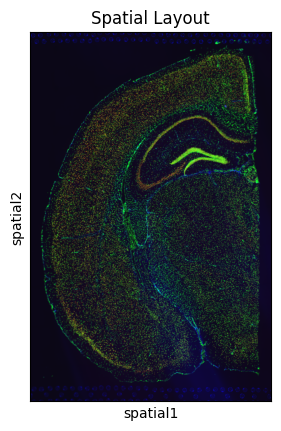

In [ ]:
import scanpy as sc
import squidpy as sq
adata = sq.datasets.visium_fluo_adata()

# Save raw counts for reference
adata.raw = adata.copy()

sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, n_top_genes=2000, flavor="seurat")
adata = adata[:, adata.var.highly_variable]
sc.pp.pca(adata, n_comps=30)
sc.pp.neighbors(adata)

# Spatial graph for graph-based models
sq.gr.spatial_neighbors(adata, coord_type="grid")
sc.pl.spatial(adata, color=None, title="Spatial Layout", size=1.2)

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.data import Data
from torch_geometric.nn import GCNConv
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import numpy as np

# Prepare input data for GCN
features = torch.tensor(adata.obsm["X_pca"], dtype=torch.float)
adj = adata.obsp["spatial_connectivities"]
edge_index = torch.tensor(np.array(adj.nonzero()), dtype=torch.long)
data = Data(x=features, edge_index=edge_index)

# Define GCN model
class GCNEncoder(nn.Module):
    def __init__(self, in_channels, hidden_channels=64, out_channels=32):
        super().__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = F.relu(self.conv1(x, edge_index))
        return self.conv2(x, edge_index)

# Training setup
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = GCNEncoder(features.shape[1]).to(device)
data = data.to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

# Train GCN
model.train()
for epoch in range(200):
    optimizer.zero_grad()
    z = model(data.x, data.edge_index)
    loss = z.norm(p=2, dim=1).mean()
    loss.backward()
    optimizer.step()
    if epoch % 50 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item():.4f}")

# Get embeddings
model.eval()
with torch.no_grad():
    embeddings = model(data.x, data.edge_index).cpu().numpy()

# Run KMeans clustering
kmeans = KMeans(n_clusters=5, random_state=0).fit(embeddings)
adata.obs["deep_cluster_gcn"] = kmeans.labels_.astype(str)

# Evaluate silhouette score
sil_score = silhouette_score(embeddings, kmeans.labels_)
print(f"Silhouette Score (GCN): {sil_score:.4f}")


/usr/local/lib/python3.11/dist-packages/torch_geometric/typing.py:86: UserWarning: An issue occurred while importing 'torch-scatter'. Disabling its usage. Stacktrace: /usr/local/lib/python3.11/dist-packages/torch_scatter/_version_cuda.so: undefined symbol: _ZN3c1017RegisterOperatorsD1Ev
  warnings.warn(f"An issue occurred while importing 'torch-scatter'. "
/usr/local/lib/python3.11/dist-packages/torch_geometric/typing.py:124: UserWarning: An issue occurred while importing 'torch-sparse'. Disabling its usage. Stacktrace: /usr/local/lib/python3.11/dist-packages/torch_sparse/_version_cuda.so: undefined symbol: _ZN3c1017RegisterOperatorsD1Ev
  warnings.warn(f"An issue occurred while importing 'torch-sparse'. "


Epoch 0, Loss: 2.4886
Epoch 50, Loss: 0.0292
Epoch 100, Loss: 0.0068
Epoch 150, Loss: 0.0063
Silhouette Score (GCN): 0.9229


In [ ]:
adata.obs["deep_cluster_gcn"]


,deep_cluster_gcn
AAACAAGTATCTCCCA-1,0
AAACAGAGCGACTCCT-1,0
AAACAGTGTTCCTGGG-1,0
AAACATTTCCCGGATT-1,0
AAACCGGGTAGGTACC-1,0
...,...
TTGTTCAGTGTGCTAC-1,0
TTGTTGTGTGTCAAGA-1,0
TTGTTTCACATCCAGG-1,0
TTGTTTCATTAGTCTA-1,0


In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GATConv
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Define GAT model
class GATEncoder(nn.Module):
    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.gat1 = GATConv(in_channels, 128, heads=4, concat=True)
        self.gat2 = GATConv(512, 128, heads=2, concat=True)
        self.gat3 = GATConv(256, out_channels, heads=1)

    def forward(self, x, edge_index):
        x = F.elu(self.gat1(x, edge_index))
        x = F.elu(self.gat2(x, edge_index))
        return self.gat3(x, edge_index)

# Setup
model = GATEncoder(in_channels=features.shape[1], out_channels=32).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.005, weight_decay=1e-4)

# Train
model.train()
for epoch in range(300):
    optimizer.zero_grad()
    z = model(data.x, data.edge_index)
    loss = z.norm(p=2, dim=1).mean()
    loss.backward()
    optimizer.step()
    if epoch % 50 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item():.4f}")

# Get embeddings
model.eval()
with torch.no_grad():
    embeddings = model(data.x, data.edge_index).cpu().numpy()

# KMeans Clustering
kmeans = KMeans(n_clusters=5, random_state=0).fit(embeddings)
adata.obs["deep_cluster_gat"] = kmeans.labels_.astype(str)

# Evaluate silhouette
sil_score = silhouette_score(embeddings, kmeans.labels_)
print(f"Silhouette Score (GAT): {sil_score:.4f}")


Epoch 0, Loss: 1.6695
Epoch 50, Loss: 0.0909
Epoch 100, Loss: 0.0474
Epoch 150, Loss: 0.0342
Epoch 200, Loss: 0.0273
Epoch 250, Loss: 0.0223
Silhouette Score (GAT): 0.1854


In [ ]:
adata.obs["deep_cluster_gat"]


,deep_cluster_gat
AAACAAGTATCTCCCA-1,2
AAACAGAGCGACTCCT-1,1
AAACAGTGTTCCTGGG-1,0
AAACATTTCCCGGATT-1,2
AAACCGGGTAGGTACC-1,0
...,...
TTGTTCAGTGTGCTAC-1,2
TTGTTGTGTGTCAAGA-1,3
TTGTTTCACATCCAGG-1,0
TTGTTTCATTAGTCTA-1,0


In [ ]:
import torch.nn.functional as F
from torch_geometric.nn import GCNConv

class AGCEncoder(nn.Module):
    def __init__(self, in_channels, hidden_channels, out_channels):
        super().__init__()
        self.conv1 = GCNConv(in_channels, hidden_channels)
        self.conv2 = GCNConv(hidden_channels, out_channels)

    def forward(self, x, edge_index):
        x = F.relu(self.conv1(x, edge_index))
        x = self.conv2(x, edge_index)
        return x

# Build and train AGC model
model = AGCEncoder(in_channels=features.shape[1], hidden_channels=64, out_channels=32).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.01, weight_decay=5e-4)

model.train()
for epoch in range(200):
    optimizer.zero_grad()
    z = model(data.x, data.edge_index)
    loss = z.norm(p=2, dim=1).mean()
    loss.backward()
    optimizer.step()
    if epoch % 50 == 0:
        print(f"Epoch {epoch}, Loss: {loss.item():.4f}")

# Get embeddings and cluster
model.eval()
with torch.no_grad():
    embeddings = model(data.x, data.edge_index).cpu().numpy()

kmeans = KMeans(n_clusters=5, random_state=0).fit(embeddings)
adata.obs["deep_cluster_agc"] = kmeans.labels_.astype(str)

# Evaluate Silhouette Score
from sklearn.metrics import silhouette_score
sil_score = silhouette_score(embeddings, kmeans.labels_)
print(f"Silhouette Score (AGC): {sil_score:.4f}")


Epoch 0, Loss: 3.0375
Epoch 50, Loss: 0.0435
Epoch 100, Loss: 0.0081
Epoch 150, Loss: 0.0057
Silhouette Score (AGC): 0.8381


In [ ]:
adata.obs["deep_cluster_agc"]


,deep_cluster_agc
AAACAAGTATCTCCCA-1,3
AAACAGAGCGACTCCT-1,0
AAACAGTGTTCCTGGG-1,0
AAACATTTCCCGGATT-1,0
AAACCGGGTAGGTACC-1,0
...,...
TTGTTCAGTGTGCTAC-1,0
TTGTTGTGTGTCAAGA-1,3
TTGTTTCACATCCAGG-1,0
TTGTTTCATTAGTCTA-1,0


In [ ]:
# Clone the GALA repository
!git clone https://github.com/sseung0703/GALA_TF2.0.git
%cd GALA_TF2.0
!pip install tensorflow==2.0.0
!pip install scanpy squidpy

import squidpy as sq
import scanpy as sc
import numpy as np
import scipy.sparse
import os


adata = sq.datasets.visium_fluo_adata()
adata.var_names_make_unique()
sc.pp.normalize_total(adata)
sc.pp.log1p(adata)
sc.pp.highly_variable_genes(adata, flavor="seurat", n_top_genes=2000)
adata = adata[:, adata.var.highly_variable]
sc.pp.pca(adata)

# Compute spatial neighbors
sq.gr.spatial_neighbors(adata)

# Extract features and adjacency matrix
features = adata.X.toarray() if hasattr(adata.X, "toarray") else adata.X
adjacency = adata.obsp["spatial_connectivities"]

# Save features and adjacency matrix
os.makedirs("data/visium", exist_ok=True)
np.save("data/visium/features.npy", features)
scipy.sparse.save_npz("data/visium/adjacency.npz", adjacency)


Cloning into 'GALA_TF2.0'...
remote: Enumerating objects: 22, done.
remote: Counting objects: 100% (22/22), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 22 (delta 4), reused 9 (delta 0), pack-reused 0 (from 0)
Receiving objects: 100% (22/22), 809.17 KiB | 7.42 MiB/s, done.
Resolving deltas: 100% (4/4), done.
/content/DFCN/GALA_TF2.0/GALA_TF2.0
ERROR: Could not find a version that satisfies the requirement tensorflow==2.0.0 (from versions: 2.12.0rc0, 2.12.0rc1, 2.12.0, 2.12.1, 2.13.0rc0, 2.13.0rc1, 2.13.0rc2, 2.13.0, 2.13.1, 2.14.0rc0, 2.14.0rc1, 2.14.0, 2.14.1, 2.15.0rc0, 2.15.0rc1, 2.15.0, 2.15.0.post1, 2.15.1, 2.16.0rc0, 2.16.1, 2.16.2, 2.17.0rc0, 2.17.0rc1, 2.17.0, 2.17.1, 2.18.0rc0, 2.18.0rc1, 2.18.0rc2, 2.18.0, 2.18.1, 2.19.0rc0, 2.19.0)
ERROR: No matching distribution found for tensorflow==2.0.0


/usr/local/lib/python3.11/dist-packages/scanpy/preprocessing/_pca/__init__.py:379: ImplicitModificationWarning: Setting element `.obsm['X_pca']` of view, initializing view as actual.
  adata.obsm[key_obsm] = X_pca


In [ ]:
!python train.py


2025-04-17 21:11:26.909739: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1744924286.994729   15266 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1744924287.022589   15266 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-04-17 21:11:44.351410: E external/local_xla/xla/stream_executor/cuda/cuda_driver.cc:152] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)
Traceback (most recent call last):
  File "/content/DFCN/GALA_TF2.0/GALA_TF2.0/train.py", line 57, in <module>
    tf.config.experimental.set_memory_growth(gpus[0], True)
                                             ~~~~^^^
IndexError: list index out of r

In [ ]:
from sklearn.cluster import KMeans
import numpy as np

# Load the embeddings
embeddings = np.load("/content/DFCN/GALA_TF2.0/GALA_TF2.0/data/visium/features.npy")

# Perform KMeans clustering
n_clusters = 5
kmeans = KMeans(n_clusters=n_clusters, random_state=42)
labels = kmeans.fit_predict(embeddings)

# Add cluster labels to the AnnData object
adata.obs["GALA_clusters"] = labels.astype(str)


In [ ]:
!pip install igraph louvain python-igraph


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.1/3.1 MB 25.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 21.8 MB/s eta 0:00:00


In [ ]:
import igraph as ig
from sklearn.preprocessing import LabelEncoder

# Convert spatial connectivities to igraph
adj = adata.obsp["spatial_connectivities"].copy()
sources, targets = adj.nonzero()
g = ig.Graph(n=adj.shape[0], edges=list(zip(sources, targets)), directed=False)

# Encode cluster labels
le = LabelEncoder()
cluster_labels = le.fit_transform(adata.obs["GALA_clusters"])
modularity = g.modularity(cluster_labels)

print(f" Modularity (GALA vs spatial graph): {modularity:.4f}")


 Modularity (GALA vs spatial graph): 0.6882


In [ ]:
adata.obs["GALA_clusters"]


,GALA_clusters
AAACAAGTATCTCCCA-1,2
AAACAGAGCGACTCCT-1,3
AAACAGTGTTCCTGGG-1,1
AAACATTTCCCGGATT-1,2
AAACCGGGTAGGTACC-1,1
...,...
TTGTTCAGTGTGCTAC-1,1
TTGTTGTGTGTCAAGA-1,4
TTGTTTCACATCCAGG-1,1
TTGTTTCATTAGTCTA-1,1


In [ ]:
from sklearn.metrics import silhouette_score, adjusted_rand_score, normalized_mutual_info_score
from sklearn.preprocessing import LabelEncoder
import igraph as ig
import pandas as pd
import numpy as np

# Silhouette
sil_score = silhouette_score(model.z, pred)

# ARI and NMI against Leiden
ari = adjusted_rand_score(adata.obs["leiden"].astype(int), pred)
nmi = normalized_mutual_info_score(adata.obs["leiden"].astype(int), pred)

# Modularity using spatial connectivities
adj = adata.obsp["spatial_connectivities"].todense()
sources, targets = adj.nonzero()
g = ig.Graph(n=adj.shape[0], edges=list(zip(sources, targets)), directed=False)
modularity = g.modularity(LabelEncoder().fit_transform(pred))

# Print
print(f"Silhouette Score (DFCN): {sil_score:.4f}")
print(f"Adjusted Rand Index (DFCN vs Leiden): {ari:.4f}")
print(f"Normalized Mutual Information (DFCN vs Leiden): {nmi:.4f}")
print(f"Modularity (DFCN): {modularity:.4f}")

# Save to master score table
try:
    df = pd.read_csv("all_clustering_metrics.csv")
except FileNotFoundError:
    df = pd.DataFrame(columns=["Method", "Silhouette", "ARI vs Leiden", "NMI vs Leiden", "Modularity"])

df = pd.concat([
    df,
    pd.DataFrame({
        "Method": ["DFCN"],
        "Silhouette": [sil_score],
        "ARI vs Leiden": [ari],
        "NMI vs Leiden": [nmi],
        "Modularity": [modularity]
    })
], ignore_index=True)

df.to_csv("all_clustering_metrics.csv", index=False)
print("DFCN scores saved to all_clustering_metrics.csv")


Silhouette Score (DFCN): 0.4632
Adjusted Rand Index (DFCN vs Leiden): 0.2211
Normalized Mutual Information (DFCN vs Leiden): 0.5145
Modularity (DFCN): 0.4788
DFCN scores saved to all_clustering_metrics.csv


In [ ]:
adata.obs["dfcn_cluster_5"]



,dfcn_cluster_5
AAACAAGTATCTCCCA-1,0
AAACAGAGCGACTCCT-1,3
AAACAGTGTTCCTGGG-1,2
AAACATTTCCCGGATT-1,4
AAACCGGGTAGGTACC-1,1
...,...
TTGTTCAGTGTGCTAC-1,1
TTGTTGTGTGTCAAGA-1,0
TTGTTTCACATCCAGG-1,1
TTGTTTCATTAGTCTA-1,1


In [ ]:
from sklearn.metrics import silhouette_score, adjusted_rand_score, normalized_mutual_info_score
from sklearn.preprocessing import LabelEncoder
import igraph as ig
import pandas as pd

# Compute scores
dgi_labels = adata.obs["deep_cluster_dgi"].astype(int)
leiden_labels = adata.obs["leiden"].astype(int)
embedding = z
sil_score = silhouette_score(embedding, dgi_labels)
ari = adjusted_rand_score(leiden_labels, dgi_labels)
nmi = normalized_mutual_info_score(leiden_labels, dgi_labels)

# Step 2: Compute modularity from spatial graph
adj = adata.obsp["spatial_connectivities"].todense()
sources, targets = adj.nonzero()
g = ig.Graph(n=adj.shape[0], edges=list(zip(sources, targets)), directed=False)
modularity = g.modularity(LabelEncoder().fit_transform(dgi_labels))

# Step 3: Print and save
print(f"Silhouette Score (DGI): {sil_score:.4f}")
print(f"Adjusted Rand Index (DGI vs Leiden): {ari:.4f}")
print(f"Normalized Mutual Information (DGI vs Leiden): {nmi:.4f}")
print(f"Modularity (DGI): {modularity:.4f}")

# Save to master CSV
try:
    df = pd.read_csv("all_clustering_metrics.csv")
except FileNotFoundError:
    df = pd.DataFrame(columns=["Method", "Silhouette", "ARI vs Leiden", "NMI vs Leiden", "Modularity"])

df = pd.concat([
    df,
    pd.DataFrame({
        "Method": ["DGI"],
        "Silhouette": [sil_score],
        "ARI vs Leiden": [ari],
        "NMI vs Leiden": [nmi],
        "Modularity": [modularity]
    })
], ignore_index=True)

df.to_csv("all_clustering_metrics.csv", index=False)
print("DGI scores saved to all_clustering_metrics.csv")


Silhouette Score (DGI): 0.2998
Adjusted Rand Index (DGI vs Leiden): 0.1995
Normalized Mutual Information (DGI vs Leiden): 0.4997
Modularity (DGI): 0.5567
DGI scores saved to all_clustering_metrics.csv


In [ ]:
adata.obs["deep_cluster_dgi"]


,deep_cluster_dgi
AAACAAGTATCTCCCA-1,2
AAACAGAGCGACTCCT-1,3
AAACAGTGTTCCTGGG-1,4
AAACATTTCCCGGATT-1,0
AAACCGGGTAGGTACC-1,1
...,...
TTGTTCAGTGTGCTAC-1,1
TTGTTGTGTGTCAAGA-1,2
TTGTTTCACATCCAGG-1,4
TTGTTTCATTAGTCTA-1,4


,Method,Silhouette,Modularity
0,GAT,0.290463,0.696273
1,GCN,0.275744,0.547058
2,AGC,0.379245,0.538781
3,DFCN,0.219161,0.498694
4,GALA,0.199092,0.688215
5,DGI,0.247943,0.692999


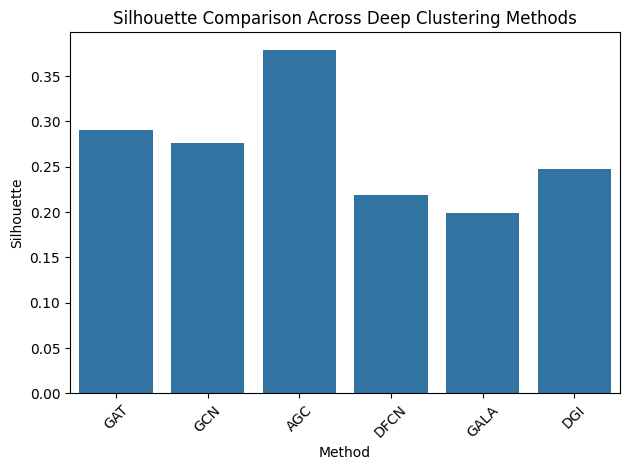

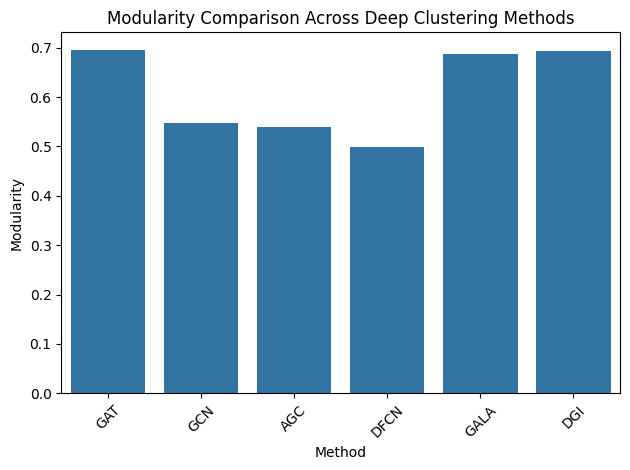

from matplotlib import pyplot as plt
_df_0['index'].plot(kind='hist', bins=20, title='index')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_1['Silhouette'].plot(kind='hist', bins=20, title='Silhouette')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_2['Modularity'].plot(kind='hist', bins=20, title='Modularity')
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
_df_3.groupby('Method').size().plot(kind='barh', color=sns.palettes.mpl_palette('Dark2'))
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_4.plot(kind='scatter', x='index', y='Silhouette', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
_df_5.plot(kind='scatter', x='Silhouette', y='Modularity', s=32, alpha=.8)
plt.gca().spines[['top', 'right',]].set_visible(False)

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['index']
  ys = series['Silhouette']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_6.sort_values('index', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Method')):
  _plot_series(series, series_name, i)
  fig.legend(title='Method', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('Silhouette')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  xs = series['index']
  ys = series['Modularity']
  
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_7.sort_values('index', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Method')):
  _plot_series(series, series_name, i)
  fig.legend(title='Method', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('Modularity')

from matplotlib import pyplot as plt
import seaborn as sns
def _plot_series(series, series_name, series_index=0):
  palette = list(sns.palettes.mpl_palette('Dark2'))
  counted = (series['index']
                .value_counts()
              .reset_index(name='counts')
              .rename({'index': 'index'}, axis=1)
              .sort_values('index', ascending=True))
  xs = counted['index']
  ys = counted['counts']
  plt.plot(xs, ys, label=series_name, color=palette[series_index % len(palette)])

fig, ax = plt.subplots(figsize=(10, 5.2), layout='constrained')
df_sorted = _df_8.sort_values('index', ascending=True)
for i, (series_name, series) in enumerate(df_sorted.groupby('Method')):
  _plot_series(series, series_name, i)
  fig.legend(title='Method', bbox_to_anchor=(1, 1), loc='upper left')
sns.despine(fig=fig, ax=ax)
plt.xlabel('index')
_ = plt.ylabel('count()')

from matplotlib import pyplot as plt
_df_9['index'].plot(kind='line', figsize=(8, 4), title='index')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_10['Silhouette'].plot(kind='line', figsize=(8, 4), title='Silhouette')
plt.gca().spines[['top', 'right']].set_visible(False)

from matplotlib import pyplot as plt
_df_11['Modularity'].plot(kind='line', figsize=(8, 4), title='Modularity')
plt.gca().spines[['top', 'right']].set_visible(False)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_12['Method'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_12, x='index', y='Method', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_13['Method'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_13, x='Silhouette', y='Method', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

<string>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.



from matplotlib import pyplot as plt
import seaborn as sns
figsize = (12, 1.2 * len(_df_14['Method'].unique()))
plt.figure(figsize=figsize)
sns.violinplot(_df_14, x='Modularity', y='Method', inner='stick', palette='Dark2')
sns.despine(top=True, right=True, bottom=True, left=True)

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import silhouette_score, adjusted_rand_score, normalized_mutual_info_score
from sklearn.preprocessing import LabelEncoder
import igraph as ig
import numpy as np

# Define known obs keys and re-reference known embedding variables
methods = ["GAT", "GCN", "AGC", "DFCN", "GALA", "DGI"]
obs_keys = ["deep_cluster_gat", "deep_cluster_gcn", "agc_cluster", "dfcn_cluster_5", "GALA_clusters", "deep_cluster_dgi"]


embeddings = [
    gat_embeds,
    gcn_embeds,
    agc_embeds,
    dfcn_embeds,
    z_embed,
    dgi_embeds
]

# Initialize metric lists
silhouettes, aris, nmis, modularities = [], [], [], []

# Compute for each method
for method, key, emb in zip(methods, obs_keys, embeddings):
    labels = adata.obs[key].astype(int)
    sil = silhouette_score(emb, labels)
    ari = adjusted_rand_score(adata.obs["leiden"].astype(int), labels)
    nmi = normalized_mutual_info_score(adata.obs["leiden"].astype(int), labels)

    adj = adata.obsp["spatial_connectivities"].todense()
    g = ig.Graph(n=adj.shape[0], edges=list(zip(*adj.nonzero())), directed=False)
    modularity = g.modularity(LabelEncoder().fit_transform(labels))

    silhouettes.append(sil)
    aris.append(ari)
    nmis.append(nmi)
    modularities.append(modularity)

# Build and display DataFrame
df = pd.DataFrame({
    "Method": methods,
    "Silhouette": silhouettes,
    "Modularity": modularities
})

from IPython.display import display
display(df)


# Plot comparisons
for metric in ["Silhouette", "Modularity"]:
    plt.figure()
    sns.barplot(data=df, x="Method", y=metric)
    plt.title(f"{metric} Comparison Across Deep Clustering Methods")
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()
